# Set up your environment

For this, we are using Google Colab.

In [1]:
# @title Import Libraries that are required for this notebook
# You may need to pip install some if you do not have these
import os
import pandas as pd
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns
from google.colab import drive
from tensorflow.keras import models
from tensorflow.keras import layers
from tensorflow.keras.utils import plot_model
from datetime import datetime
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, roc_curve, roc_auc_score
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis
print("=" * 42)

In [2]:
#  @title Setup direct access to google.colab through import drive
print("=" * 42)
print("Mounting Google Drive... please follow steps.....")
drive.mount('/content/gdrive')
print('.....Google Drive is sucessfully mounted for access from Colab')
print("=" * 42)

Mounting Google Drive... please follow steps.....
Mounted at /content/gdrive
.....Google Drive is sucessfully mounted for access from Colab


In [3]:
#  @title Check if there is GPU access
print("=" * 32)
print("-" * 32)
print("Checking for GPUs.....")
d_n = tf.test.gpu_device_name()
if d_n != '/device:GPU:0':  # GPU should == 0
    raise SystemError('GPU device not found')
# Print error if GPU != 0
# If GPU is not listed, go "Edit - add GPU" in Colab.
# You will need to restart and rerun.
print('GPU located at: {}'.format(d_n))
print("GPU located at : ", tf.test.gpu_device_name())
print("# of GPUs : ", len(tf.config.experimental.list_physical_devices('GPU')))
print(".....Checking for GPU complete")
print("-" * 32)
print("=" * 32)

--------------------------------
Checking for GPUs.....
GPU located at: /device:GPU:0
GPU located at :  /device:GPU:0
# of GPUs :  1
.....Checking for GPU complete
--------------------------------


In [4]:
# @title Define all the functions here

def predict_and_plot(model, inputs, targets, name=''):
    """ The following is for defining function for models and for printing out
        as required.  It does Accuracy, confusion matrix, ROC and AUC, as well as Class report, and adds lines in between for ease of reading.  Colour is set to purple.

    Parameters:
    model (object): The Model
    inputs (array): The Model Inputs
    targets (array): The Model Targets
    name (string): The Model Name

    Returns:
    object: The Model
    """

    preds = model.predict(inputs)
    preds_prob = model.predict_proba(inputs)[:, 1]
    accuracy = accuracy_score(targets, preds)

    # Accuracy
    print("=" * 62)
    print(f"{name} Accuracy: {accuracy * 100:.2f}%")
    print("=" * 62)

    # Confusion matrix
    cf = confusion_matrix(targets, preds, normalize='true')
    plt.figure(figsize=(5, 3))
    sns.heatmap(cf, annot=True, cmap='Purples', fmt=".2f", cbar=False)
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(f'{name} Confusion Matrix')
    plt.show()
    print("=" * 62)

    # ROC Curve and AUC
    fpr, tpr, _ = roc_curve(targets, preds_prob)
    roc_auc = roc_auc_score(targets, preds_prob)
    plt.figure(figsize=(5, 3))
    plt.plot(fpr, tpr, color='mediumpurple', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='pink', lw=2, linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'{name} ROC Curve')
    plt.legend(loc='lower right')
    plt.show()
    print("=" * 62)

    # class report
    print("Classification Report for Model:")
    print(f"{name} Classification Report:\n", classification_report(targets, preds, zero_division=1))

    # AUC!!!
    print("=" * 62)
    print("AUC Scores")
    print(f"{name} AUC Score: {roc_auc:.2f}")
    print("=" * 62)
    # return preds

In [5]:
# @title list other things here:
#  List of all the things here:

binary_ter = ['Diabetes_012', 'HighBP', 'HighChol', 'CholCheck', 'Smoker',
              'Stroke', 'HeartDiseaseorAttack', 'PhysActivity', 'Fruits',
              'Veggies', 'HvyAlcoholConsump', 'AnyHealthcare', 'NoDocbcCost',
              'DiffWalk', 'Sex', 'Age']

features_multi = ['BMI', 'PhysActivity', 'Fruits', 'Veggies',
                  'HvyAlcoholConsump', 'AnyHealthcare', 'NoDocbcCost',
                  'GenHlth', 'MentHlth', 'PhysHlth', 'DiffWalk', 'Sex', 'Age',
                  'Education', 'Income']

features = [
    ('Age', 'Box Plot of Age', 'boxplot'),
    ('Age', 'Age Distribution', 'histplot'),
    ('Sex', 'Sex Distribution', 'countplot'),
    ('HighBP', 'HighBP Distribution', 'countplot'),
    ('HighChol', 'HighChol Distribution', 'countplot'),
    ('CholCheck', 'CholCheck Distribution', 'countplot'),
    ('BMI', 'BMI Distribution', 'countplot'),
    ('Smoker', 'Smoker Distribution', 'countplot'),
    ('Stroke', 'Stroke Distribution', 'countplot'),
    ('HeartDiseaseorAttack', 'HeartDiseaseorAttack Distribution', 'countplot'),
    ('PhysActivity', 'PhysActivity Distribution', 'countplot'),
    ('Fruits', 'Fruits Distribution', 'countplot'),
    ('Veggies', 'Veggies Distribution', 'countplot'),
    ('HvyAlcoholConsump', 'HvyAlcoholConsump Distribution', 'countplot'),
    ('AnyHealthcare', 'AnyHealthcare Distribution', 'countplot'),
    ('NoDocbcCost', 'NoDocbcCost Distribution', 'countplot'),
    ('GenHlth', 'GenHlth Distribution', 'countplot'),
    ('MentHlth', 'MentHlth Distribution', 'countplot'),
    ('PhysHlth', 'PhysHlth Distribution', 'countplot'),
    ('DiffWalk', 'DiffWalk Distribution', 'countplot'),
    ('Education', 'Education Distribution', 'countplot'),
    ('Income', 'Income Distribution', 'countplot'),
    ('Diabetes_012', 'Diabetes_012 Distribution', 'countplot')
]

features_2 = ['Diabetes_012', 'HighBP', 'HighChol', 'CholCheck', 'BMI',
              'Smoker', 'Stroke', 'HeartDiseaseorAttack', 'PhysActivity',
              'Fruits', 'Veggies', 'HvyAlcoholConsump', 'AnyHealthcare',
              'NoDocbcCost', 'GenHlth', 'MentHlth', 'PhysHlth', 'DiffWalk',
              'Sex', 'Age', 'Education', 'Income']

#New Dataset - Prediabetes

This is looking into the new dataset, specifically the one with Prediabetes not listed into Diabetes.

This is to see if we can look at prediction Prediabetes easily - as predicition earlier gives a better outcome for the person.

We are looking at the following specific file -

diabetes _ 012 _ health _ indicators _ BRFSS2015.csv is a clean dataset of 253,680 survey responses to the CDC's BRFSS2015. The target variable Diabetes_012 has 3 classes. 0 is for no diabetes or only during pregnancy, 1 is for prediabetes, and 2 is for diabetes. There is class imbalance in this dataset. This dataset has 21 feature variables

For this, we are looking at how to predict and prevent diabetes.  We are looking at prediabetes.

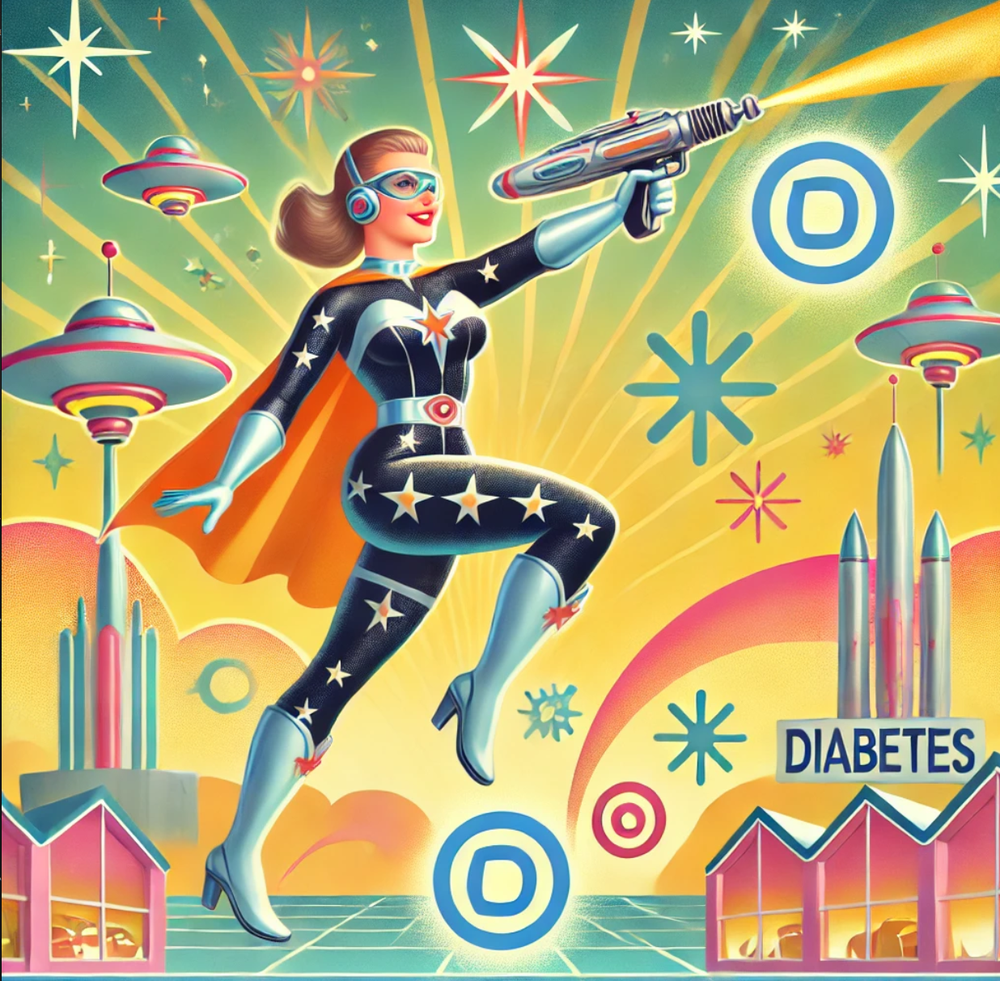

## Data source.

The data for these datasets were sourced initially by rsearchers from the US Department of Health and Human Services, Centre for Disease Control (CDC).  The original dataset locations are:

    - [Behavioral Risk Factor Surveillance System]
    (https://www.cdc.gov/brfss/annual_data/annual_data.htm)

    - [CDC - 2015 Behavioural Risk Factor Surveillance System (BRFSS) Survey Data and Documentation]
    (https://www.cdc.gov/brfss/annual_data/annual_2015.html)

    - [The Behavioural Risk Factor Surveillance System 2015 Codebook]
    (https://www.cdc.gov/brfss/annual_data/2015/pdf/codebook15_llcp.pdf)

The first dataset is:

    - [CDC Diabetes Health Indicators]
    (https://archive.ics.uci.edu/dataset/891/cdc+diabetes+health+indicators)

    - [CDC Diabetes Data]
    (https://archive.ics.uci.edu/static/public/891/data.csv)

Data Abstract: The Diabetes Health Indicators Dataset contains healthcare statistics and lifestyle survey information about people in general along with their diagnosis of diabetes. The 35 features consist of some demographics, lab test results, and answers to survey questions for each patient. The target variable for classification is whether a patient has diabetes, is pre-diabetic, or healthy.


There are 253680 instances, and 20 features of data in this dataset.

The dataset was cleaned by researchers as noted here:
dataset folder contains three files, and is also based on the BRFSS 2015.  This is being used to extend analysis to look at prediabetes, as the files include where prediabetes and diabetes are listed as separate entries.  This is being used to further enhance analysis and modelling.

    - [Diabetes Health Indicators]
    (https://www.kaggle.com/datasets/alexteboul/diabetes-health-indicators-dataset)

    - [Originally_referenced_CDC_dataset]
    (https://www.cdc.gov/brfss/annual_data/annual_data.htm)

    - [Data_Referenced_through]
    (https://www.kaggle.com/datasets/cdc/behavioral-risk-factor-surveillance-system)

    - Abstract: This dataset contains 3 files:
            - diabetes _ 012 _ health _ indicators _ BRFSS2015.csv is a clean dataset of 253,680 survey responses to the CDC's BRFSS2015. The target variable Diabetes_012 has 3 classes. 0 is for no diabetes or only during pregnancy, 1 is for prediabetes, and 2 is for diabetes. There is class imbalance in this dataset. This dataset has 21 feature variables
            - diabetes _ binary _ 5050split _ health _ indicators _ BRFSS2015.csv is a clean dataset of 70,692 survey responses to the CDC's BRFSS2015. It has an equal 50-50 split of respondents with no diabetes and with either prediabetes or diabetes. The target variable Diabetes_binary has 2 classes. 0 is for no diabetes, and 1 is for prediabetes or diabetes. This dataset has 21 feature variables and is balanced.
            - diabetes _ binary _ health _ indicators _ BRFSS2015.csv is a clean dataset of 253,680 survey responses to the CDC's BRFSS2015. The target variable Diabetes_binary has 2 classes. 0 is for no diabetes, and 1 is for prediabetes or diabetes. This dataset has 21 feature variables and is not balanced.

The data is sourced from UCIML Repo (UC Irvine Machine Learning Repository), Markelle Kelly, Rachel Longjohn, Kolby Nottingham,
The UCI Machine Learning Repository, https://archive.ics.uci.edu

Further screenshots below have been pulled out to assist with viewing the data.

Details of the dataset:

  - name: 'CDC Diabetes Health Indicators'
  - repository_url: 'https://archive.ics.uci.edu/dataset/891/cdc+diabetes+health+indicators'
  - data_url: 'https://archive.ics.uci.edu/static/public/891/data.csv'
  - abstract: 'The Diabetes Health Indicators Dataset contains healthcare statistics and lifestyle survey information about people in general along with their diagnosis of diabetes. The 35 features consist of some demographics, lab test results, and answers to survey questions for each patient. The target variable for classification is whether a patient has diabetes, is pre-diabetic, or healthy.'

Below is the breakdown of the features.  

Further details for those not listed out, are broken out further below as well.

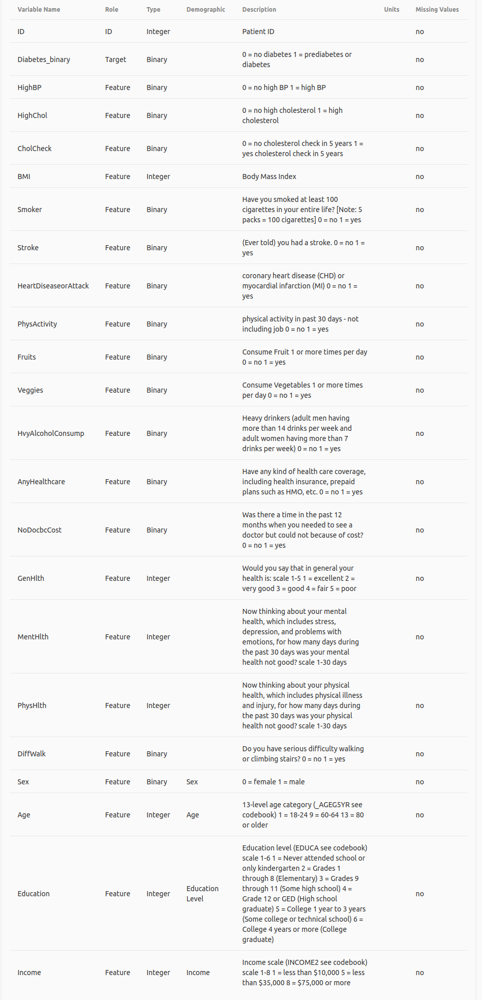

Below is the breakdown of Income level breakdown (INCOME2).

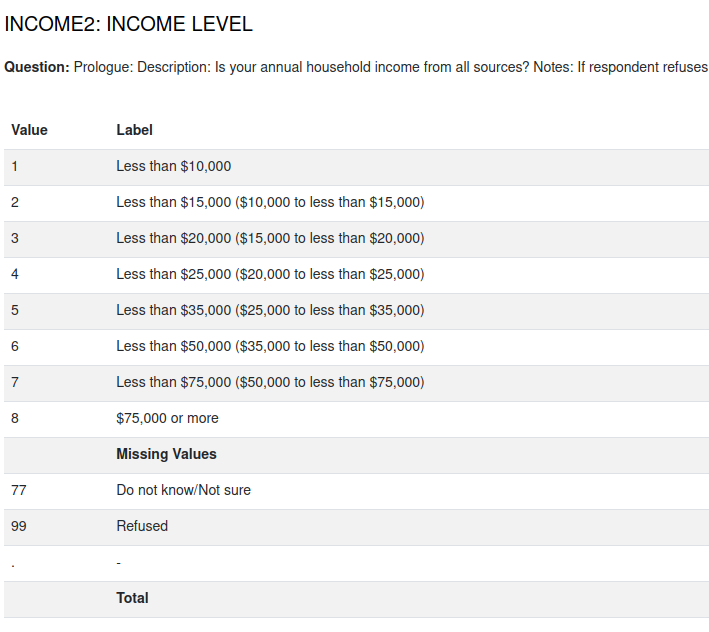

Below is age group break down of AGE5YR (eg; '12' isn't age 12, it is the 12th category).

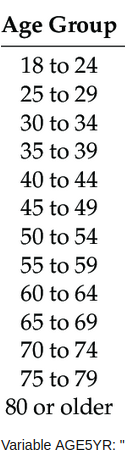

In [6]:
#  @title Download the dataset and load into your Google drive, then import the file
print("=" * 42)
print("-" * 42)
df = pd.read_csv('gdrive/My Drive/diabetes_012_health_indicators_BRFSS2015.csv')
print('File has been sucessfully loaded from your Google Drive into this notebook')
print("=" * 42)
print("Checking file for data errors")
print("Check for NaN values, and display here:")
print("=" * 42)
df.isna().sum()
print("=" * 42)
print("Check for any null values where python hasn't identified as NaN, display here:")
print(np.where(pd.isnull(df)))
print("-" * 42)
print("=" * 42)

------------------------------------------
File has been sucessfully loaded from your Google Drive into this notebook
Checking file for data errors
Check for NaN values, and display here:
Check for any null values where python hasn't identified as NaN, display here:
(array([], dtype=int64), array([], dtype=int64))
------------------------------------------


In [7]:
#  @title Describe the data
df.describe()

,Diabetes_012,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
count,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,...,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000
mean,0.296921,0.429001,0.424121,0.962670,28.382364,0.443169,0.040571,0.094186,0.756544,0.634256,...,0.951053,0.084177,2.511392,3.184772,4.242081,0.168224,0.440342,8.032119,5.050434,6.053875
std,0.698160,0.494934,0.494210,0.189571,6.608694,0.496761,0.197294,0.292087,0.429169,0.481639,...,0.215759,0.277654,1.068477,7.412847,8.717951,0.374066,0.496429,3.054220,0.985774,2.071148
min,0.000000,0.000000,0.000000,0.000000,12.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000
25%,0.000000,0.000000,0.000000,1.000000,24.000000,0.000000,0.000000,0.000000,1.000000,0.000000,...,1.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,6.000000,4.000000,5.000000
50%,0.000000,0.000000,0.000000,1.000000,27.000000,0.000000,0.000000,0.000000,1.000000,1.000000,...,1.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,8.000000,5.000000,7.000000
75%,0.000000,1.000000,1.000000,1.000000,31.000000,1.000000,0.000000,0.000000,1.000000,1.000000,...,1.000000,0.000000,3.000000,2.000000,3.000000,0.000000,1.000000,10.000000,6.000000,8.000000
max,2.000000,1.000000,1.000000,1.000000,98.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,5.000000,30.000000,30.000000,1.000000,1.000000,13.000000,6.000000,8.000000


In [8]:
#  @title Inspect the Data
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 253680 entries, 0 to 253679
Data columns (total 22 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   Diabetes_012          253680 non-null  float64
 1   HighBP                253680 non-null  float64
 2   HighChol              253680 non-null  float64
 3   CholCheck             253680 non-null  float64
 4   BMI                   253680 non-null  float64
 5   Smoker                253680 non-null  float64
 6   Stroke                253680 non-null  float64
 7   HeartDiseaseorAttack  253680 non-null  float64
 8   PhysActivity          253680 non-null  float64
 9   Fruits                253680 non-null  float64
 10  Veggies               253680 non-null  float64
 11  HvyAlcoholConsump     253680 non-null  float64
 12  AnyHealthcare         253680 non-null  float64
 13  NoDocbcCost           253680 non-null  float64
 14  GenHlth               253680 non-null  float64
 15  

In [9]:
#  @title Inspect the data
df.head()

,Diabetes_012,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
0,0.0,1.0,1.0,1.0,40.0,1.0,0.0,0.0,0.0,0.0,...,1.0,0.0,5.0,18.0,15.0,1.0,0.0,9.0,4.0,3.0
1,0.0,0.0,0.0,0.0,25.0,1.0,0.0,0.0,1.0,0.0,...,0.0,1.0,3.0,0.0,0.0,0.0,0.0,7.0,6.0,1.0
2,0.0,1.0,1.0,1.0,28.0,0.0,0.0,0.0,0.0,1.0,...,1.0,1.0,5.0,30.0,30.0,1.0,0.0,9.0,4.0,8.0
3,0.0,1.0,0.0,1.0,27.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,2.0,0.0,0.0,0.0,0.0,11.0,3.0,6.0
4,0.0,1.0,1.0,1.0,24.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,2.0,3.0,0.0,0.0,0.0,11.0,5.0,4.0


In [10]:
#  @title Inspect the columns
df.columns

Index(['Diabetes_012', 'HighBP', 'HighChol', 'CholCheck', 'BMI', 'Smoker',
       'Stroke', 'HeartDiseaseorAttack', 'PhysActivity', 'Fruits', 'Veggies',
       'HvyAlcoholConsump', 'AnyHealthcare', 'NoDocbcCost', 'GenHlth',
       'MentHlth', 'PhysHlth', 'DiffWalk', 'Sex', 'Age', 'Education',
       'Income'],
      dtype='object')

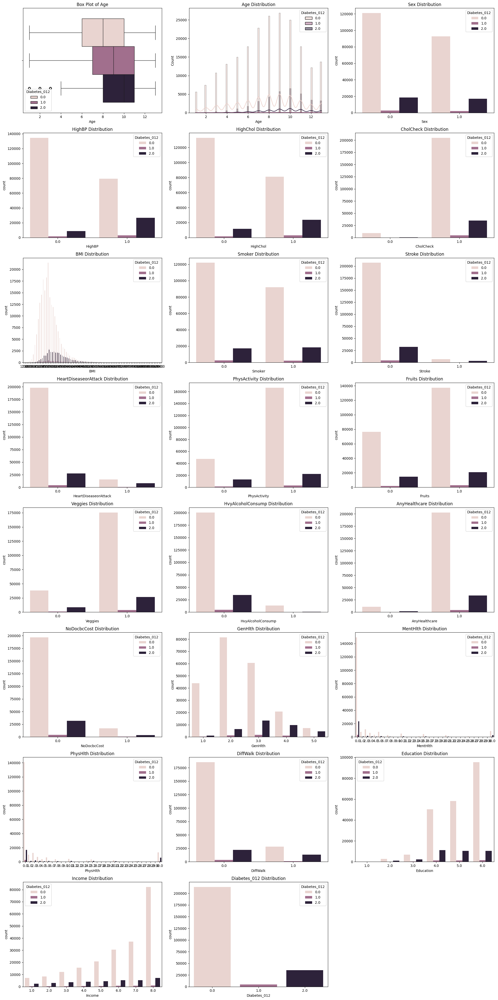

In [11]:
#  @title Print out graphs for No Diabetes

plt.figure(figsize=(20, 40))

for i, (feature, title, plot_type) in enumerate(features):
    plt.subplot(8, 3, i + 1)
    if plot_type == 'boxplot':
        sns.boxplot(x=feature, data=df, hue='Diabetes_012')
    elif plot_type == 'histplot':
        sns.histplot(data=df, x=feature, hue='Diabetes_012', kde=True)
    else:
        sns.countplot(x=feature, data=df, hue='Diabetes_012')
    plt.title(title)

plt.tight_layout()
plt.show()

In [12]:
#  @title Split out into three sets - Diabetes only, Prediabetes and No Diabetes to inspect individually.
diabetes_df = df[df.Diabetes_012 == 2]
pre_d_df = df[df.Diabetes_012 == 1]
no_d = df[df.Diabetes_012 == 0]
# Turn into pd DataFrames
diabetes_df = pd.DataFrame(diabetes_df)
pre_d_df = pd.DataFrame(pre_d_df)
no_d = pd.DataFrame(no_d)

In [13]:
#  @title Inspect (No Diabetes)
no_d.info()

<class 'pandas.core.frame.DataFrame'>
Index: 213703 entries, 0 to 253678
Data columns (total 22 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   Diabetes_012          213703 non-null  float64
 1   HighBP                213703 non-null  float64
 2   HighChol              213703 non-null  float64
 3   CholCheck             213703 non-null  float64
 4   BMI                   213703 non-null  float64
 5   Smoker                213703 non-null  float64
 6   Stroke                213703 non-null  float64
 7   HeartDiseaseorAttack  213703 non-null  float64
 8   PhysActivity          213703 non-null  float64
 9   Fruits                213703 non-null  float64
 10  Veggies               213703 non-null  float64
 11  HvyAlcoholConsump     213703 non-null  float64
 12  AnyHealthcare         213703 non-null  float64
 13  NoDocbcCost           213703 non-null  float64
 14  GenHlth               213703 non-null  float64
 15  MentH

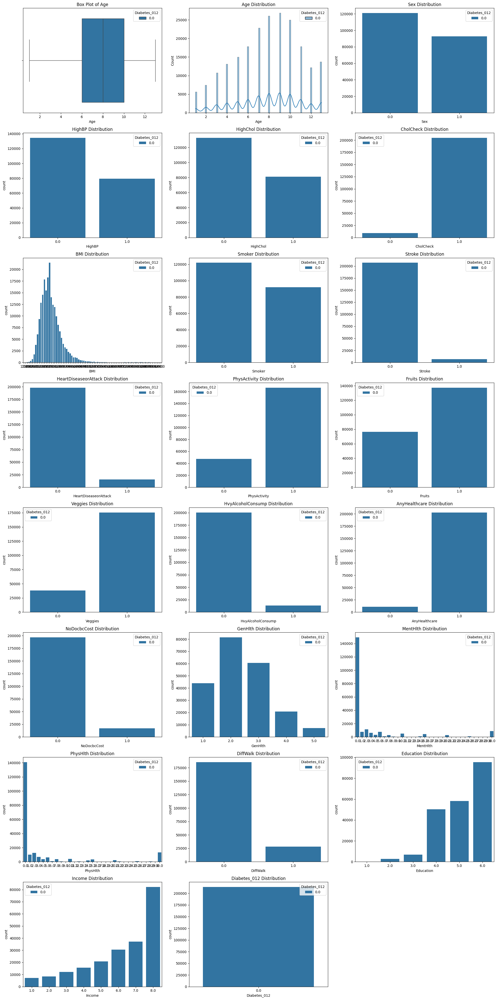

In [14]:
#  @title Print out features for No Diabeles

plt.figure(figsize=(20, 40))

for i, (feature, title, plot_type) in enumerate(features):
    plt.subplot(8, 3, i + 1)
    if plot_type == 'boxplot':
        sns.boxplot(x=feature, data=no_d, hue='Diabetes_012')
    elif plot_type == 'histplot':
        sns.histplot(data=no_d, x=feature, hue='Diabetes_012', kde=True)
    else:
        sns.countplot(x=feature, data=no_d, hue='Diabetes_012')
    plt.title(title)

plt.tight_layout()
plt.show()

#PreDiabetes

In [15]:
#  @title Print out info for PreDiabetes
pre_d_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4631 entries, 64 to 253666
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Diabetes_012          4631 non-null   float64
 1   HighBP                4631 non-null   float64
 2   HighChol              4631 non-null   float64
 3   CholCheck             4631 non-null   float64
 4   BMI                   4631 non-null   float64
 5   Smoker                4631 non-null   float64
 6   Stroke                4631 non-null   float64
 7   HeartDiseaseorAttack  4631 non-null   float64
 8   PhysActivity          4631 non-null   float64
 9   Fruits                4631 non-null   float64
 10  Veggies               4631 non-null   float64
 11  HvyAlcoholConsump     4631 non-null   float64
 12  AnyHealthcare         4631 non-null   float64
 13  NoDocbcCost           4631 non-null   float64
 14  GenHlth               4631 non-null   float64
 15  MentHlth              4

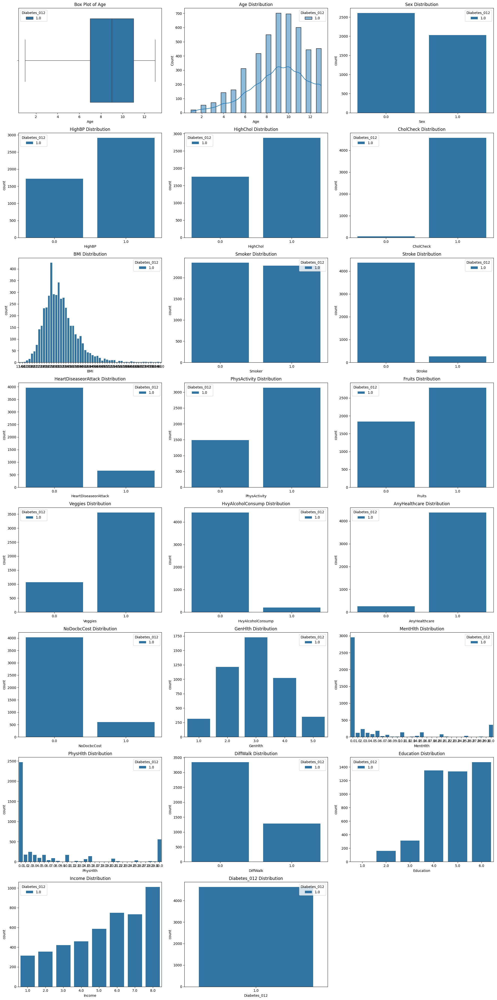

In [16]:
#  @title Print out features for Pre Diabetes

plt.figure(figsize=(20, 40))

for i, (feature, title, plot_type) in enumerate(features):
    plt.subplot(8, 3, i + 1)
    if plot_type == 'boxplot':
        sns.boxplot(x=feature, data=pre_d_df, hue='Diabetes_012')
    elif plot_type == 'histplot':
        sns.histplot(data=pre_d_df, x=feature, hue='Diabetes_012', kde=True)
    else:
        sns.countplot(x=feature, data=pre_d_df, hue='Diabetes_012')
    plt.title(title)

plt.tight_layout()
plt.show()

#Diabetes

In [17]:
#  @title Print out info for Diabetes
diabetes_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 35346 entries, 8 to 253679
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Diabetes_012          35346 non-null  float64
 1   HighBP                35346 non-null  float64
 2   HighChol              35346 non-null  float64
 3   CholCheck             35346 non-null  float64
 4   BMI                   35346 non-null  float64
 5   Smoker                35346 non-null  float64
 6   Stroke                35346 non-null  float64
 7   HeartDiseaseorAttack  35346 non-null  float64
 8   PhysActivity          35346 non-null  float64
 9   Fruits                35346 non-null  float64
 10  Veggies               35346 non-null  float64
 11  HvyAlcoholConsump     35346 non-null  float64
 12  AnyHealthcare         35346 non-null  float64
 13  NoDocbcCost           35346 non-null  float64
 14  GenHlth               35346 non-null  float64
 15  MentHlth              3

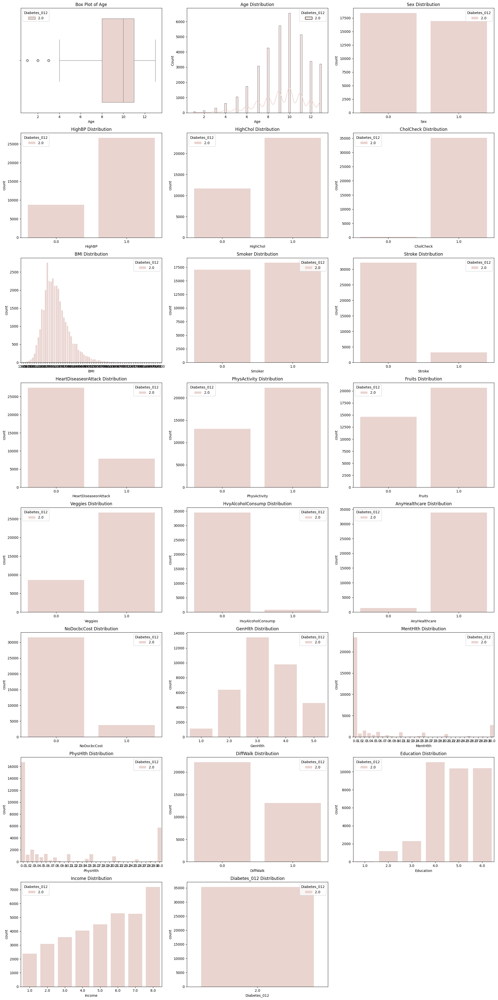

In [18]:
#  @title Print out features for Diabetes

plt.figure(figsize=(20, 40))

for i, (feature, title, plot_type) in enumerate(features):
    plt.subplot(8, 3, i + 1)
    if plot_type == 'boxplot':
        sns.boxplot(x=feature, data=diabetes_df, hue='Diabetes_012')
    elif plot_type == 'histplot':
        sns.histplot(data=diabetes_df, x=feature, hue='Diabetes_012', kde=True)
    else:
        sns.countplot(x=feature, data=diabetes_df, hue='Diabetes_012')
    plt.title(title)

plt.tight_layout()
plt.show()

In [19]:
#  @title Set up individul datasets
diabetes_df = df[df.Diabetes_012 == 2]
pre_d_df = df[df.Diabetes_012 == 1]
no_d = df[df.Diabetes_012 == 0]
d_vs_pre_d = df[df.Diabetes_012 >= 1]
pre_d_vs_no_d = df[df.Diabetes_012 <= 1]
diabets_vs_no_d = df[(df.Diabetes_012 == 0) | (df.Diabetes_012 == 2)]

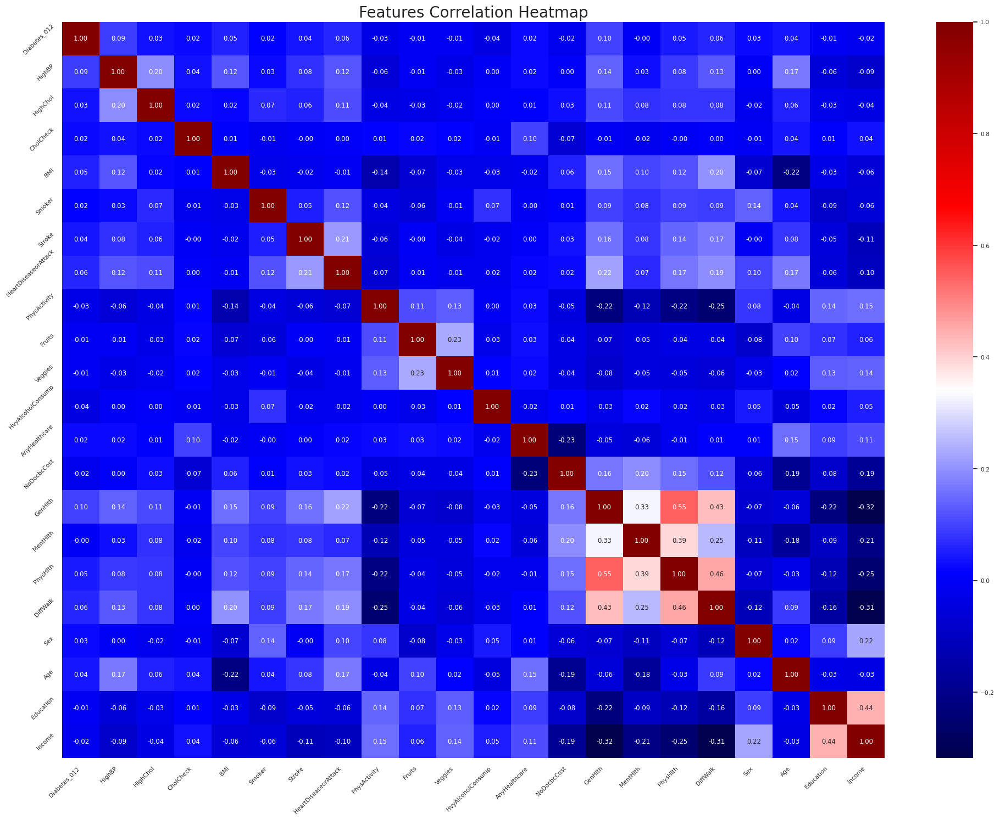

In [20]:
# @title Features correlation headmap diabetes vs prediabetes
correlation = d_vs_pre_d[features_2].corr()
plt.figure(figsize=(20, 15))
sns.set(font_scale=0.7)
sns.heatmap(correlation, annot=True, cmap='seismic', fmt=".2f")
plt.title('Features Correlation Heatmap', fontsize=20)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=45)
plt.tight_layout()
plt.show()

In [21]:
# @title Create correlation scores for analysis
corr_matrix = d_vs_pre_d.corr()
correl_abs = abs(corr_matrix.Diabetes_012)
correl_abs.columns=['feature', 'correlation']
correl_abs.sort_values(ascending=False)

,Diabetes_012
Diabetes_012,1.000000
GenHlth,0.099243
HighBP,0.090034
DiffWalk,0.062485
HeartDiseaseorAttack,0.062072
BMI,0.053257
PhysHlth,0.045890
HvyAlcoholConsump,0.042977
Age,0.039945
Stroke,0.039727


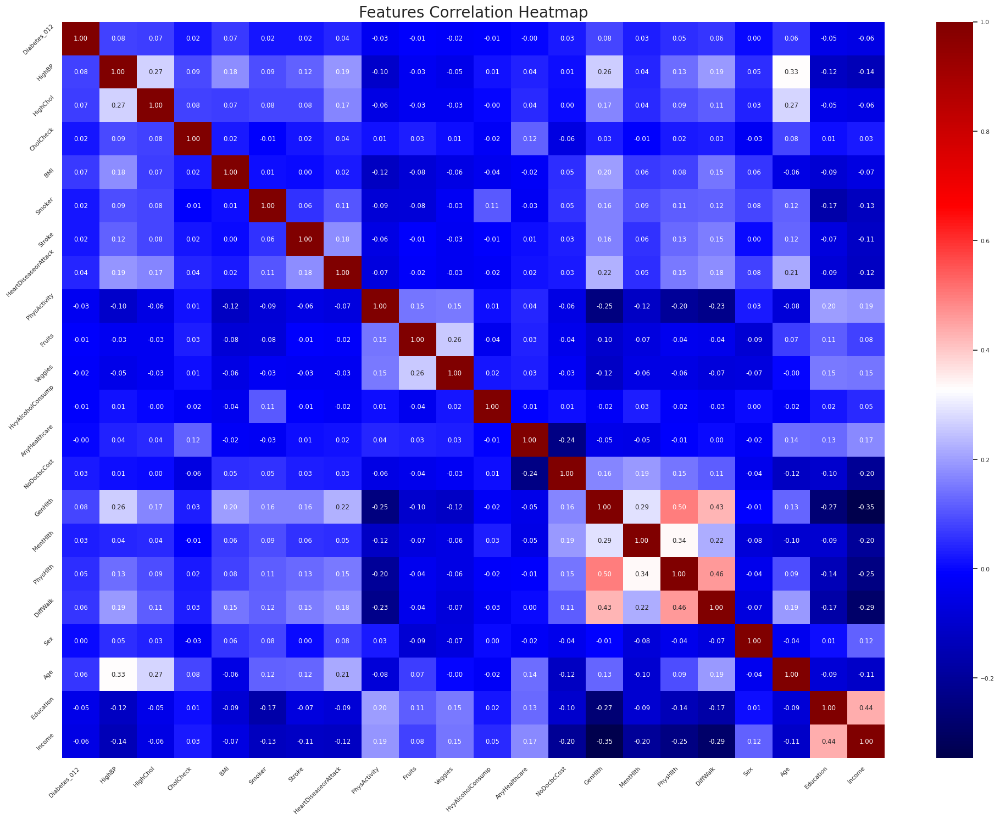

In [22]:
# @title Features correlation headmap prediabetes vs no diabetes
correlation2 = pre_d_vs_no_d[features_2].corr()
plt.figure(figsize=(20, 15))
sns.set(font_scale=0.7)
sns.heatmap(correlation2, annot=True, cmap='seismic', fmt=".2f")
plt.title('Features Correlation Heatmap', fontsize=20)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=45)
plt.tight_layout()
plt.show()

In [23]:
# @title Create correlation scores for analysis
corr_matrix2 = pre_d_vs_no_d.corr()
correl_abs2 = abs(corr_matrix2.Diabetes_012)
correl_abs2.columns=['feature', 'correlation']
correl_abs2.sort_values(ascending=False)

,Diabetes_012
Diabetes_012,1.000000
GenHlth,0.084940
HighBP,0.076689
HighChol,0.071578
BMI,0.068293
Income,0.061366
DiffWalk,0.061152
Age,0.060249
PhysHlth,0.049417
Education,0.048144


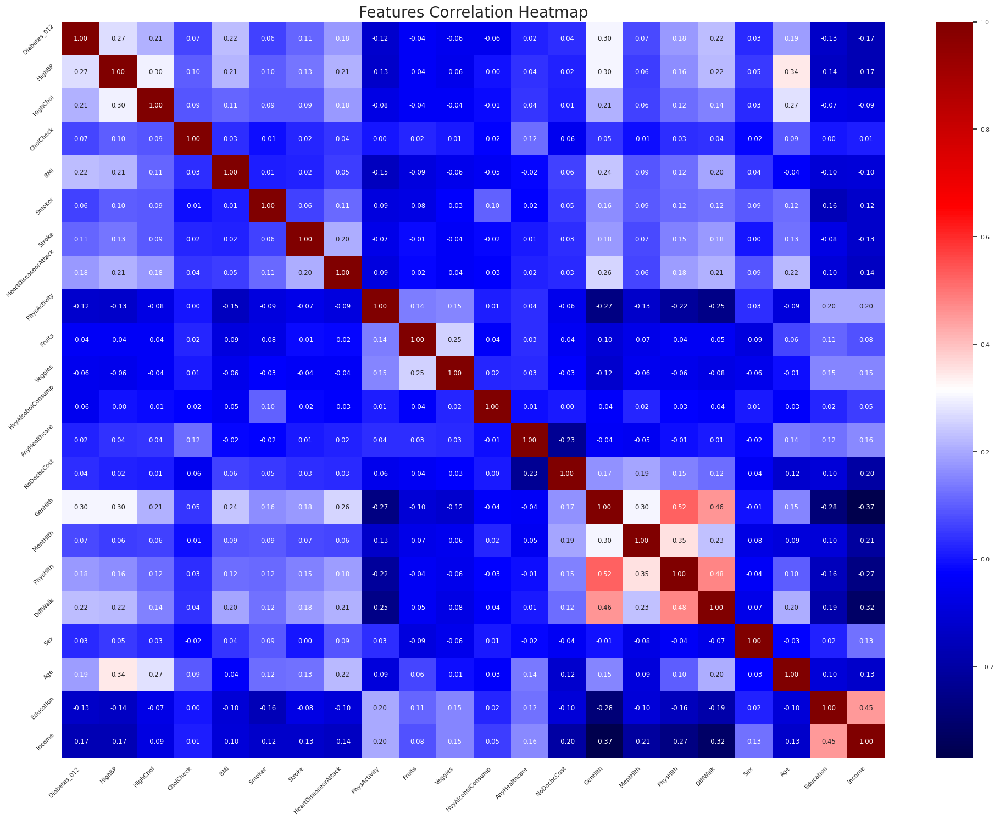

In [24]:
# @title Features correlation headmap
correlation3 = df[features_2].corr()
plt.figure(figsize=(20, 15))
sns.set(font_scale=0.7)
sns.heatmap(correlation3, annot=True, cmap='seismic', fmt=".2f")
plt.title('Features Correlation Heatmap', fontsize=20)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=45)
plt.tight_layout()
plt.show()

In [25]:
# @title Create correlation scores for analysis
corr_matrix3 = df.corr()
correl_abs3 = abs(corr_matrix3.Diabetes_012)
correl_abs3.columns=['feature', 'correlation']
correl_abs3.sort_values(ascending=False)

,Diabetes_012
Diabetes_012,1.000000
GenHlth,0.302587
HighBP,0.271596
BMI,0.224379
DiffWalk,0.224239
HighChol,0.209085
Age,0.185026
HeartDiseaseorAttack,0.180272
PhysHlth,0.176287
Income,0.171483


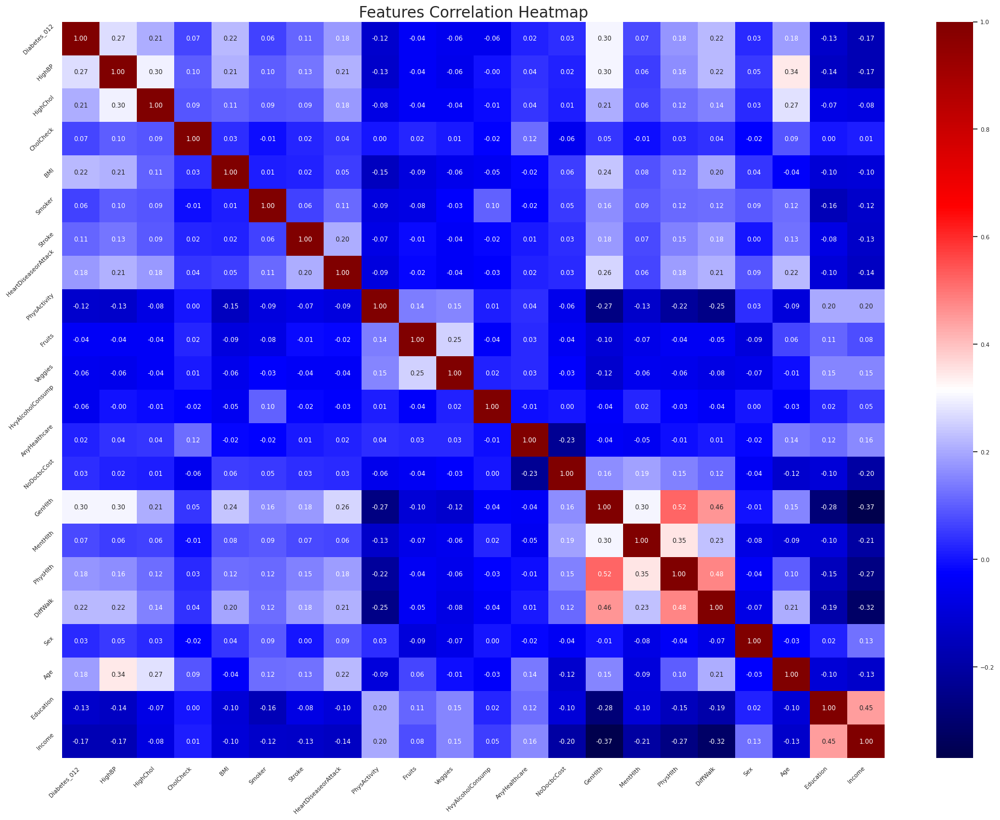

In [26]:
# @title Features correlation headmap - Diabetes vs no Diabetes (prediabetes excluded)
correlation4 = diabets_vs_no_d[features_2].corr()
plt.figure(figsize=(20, 15))
sns.set(font_scale=0.7)
sns.heatmap(correlation4, annot=True, cmap='seismic', fmt=".2f")
plt.title('Features Correlation Heatmap', fontsize=20)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=45)
plt.tight_layout()
plt.show()

In [27]:
# @title Create correlation scores for analysis
corr_matrix4 = diabets_vs_no_d.corr()
correl_abs4 = abs(corr_matrix4.Diabetes_012)
correl_abs4.columns=['feature', 'correlation']
correl_abs4.sort_values(ascending=False)

,Diabetes_012
Diabetes_012,1.000000
GenHlth,0.300347
HighBP,0.269319
DiffWalk,0.223991
BMI,0.222353
HighChol,0.205684
Age,0.181727
HeartDiseaseorAttack,0.181258
PhysHlth,0.175754
Income,0.168651


In [28]:
# @title Create correlation tables for analysis
correl_abs_df = pd.DataFrame(correl_abs)
correl_abs_df = correl_abs_df.rename(columns={'Diabetes_012' :
                                              'Diabetes_v_Prediabetes'})

correl_abs2_df = pd.DataFrame(correl_abs2)
correl_abs2_df = correl_abs2_df.rename(columns={'Diabetes_012' :
                                                'No_diabetes_v_Prediabetes'})

correl_abs4_df = pd.DataFrame(correl_abs4)
correl_abs4_df = correl_abs4_df.rename(columns={'Diabetes_012' :
                                                'No_diabetes_v_Diabetes'})

correl_abs3_df = pd.DataFrame(correl_abs3)
correls = pd.concat([correl_abs_df, correl_abs2_df, correl_abs3_df, correl_abs4_df], axis=1)

correls

,Diabetes_v_Prediabetes,No_diabetes_v_Prediabetes,Diabetes_012,No_diabetes_v_Diabetes
Diabetes_012,1.000000,1.000000,1.000000,1.000000
HighBP,0.090034,0.076689,0.271596,0.269319
HighChol,0.033415,0.071578,0.209085,0.205684
CholCheck,0.024243,0.021131,0.067546,0.066037
BMI,0.053257,0.068293,0.224379,0.222353
Smoker,0.016300,0.018355,0.062914,0.062212
Stroke,0.039727,0.020900,0.107179,0.107990
HeartDiseaseorAttack,0.062072,0.039542,0.180272,0.181258
PhysActivity,0.031884,0.034821,0.121947,0.121028
Fruits,0.010924,0.012257,0.042192,0.041736


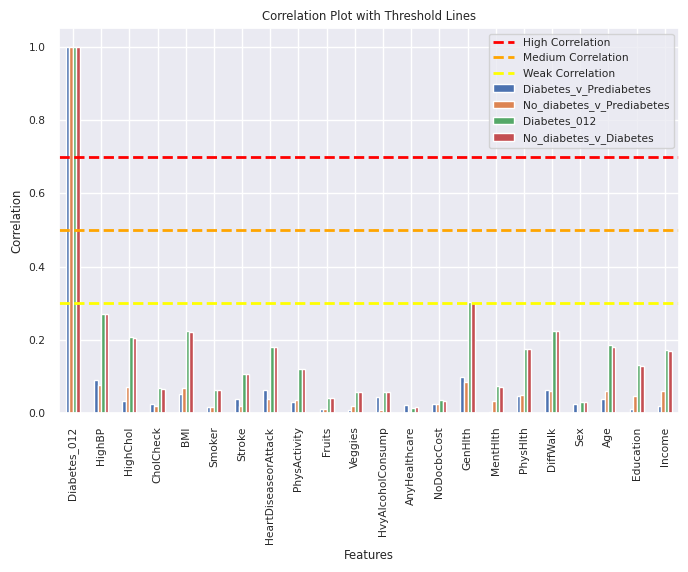

In [29]:
#  @title Create graph to inspect
correls.plot(kind='bar', legend=True, figsize=(8, 5))

plt.axhline(y=0.7, color='red', linestyle='--', linewidth=2, label='High Correlation')
plt.axhline(y=0.5, color='orange', linestyle='--', linewidth=2, label='Medium Correlation')
plt.axhline(y=0.3, color='yellow', linestyle='--', linewidth=2, label='Weak Correlation')
plt.legend()
plt.title('Correlation Plot with Threshold Lines')
plt.xlabel('Features')
plt.ylabel('Correlation')
plt.show()

In [30]:
# @title Create correlation table for analysis
correl_abs_df = pd.DataFrame(correl_abs)
correl_abs_df = correl_abs_df.rename(columns={'Diabetes_012' :
                                              'Diabetes_v_Prediabetes'})

correl_abs2_df = pd.DataFrame(correl_abs2)
correl_abs2_df = correl_abs2_df.rename(columns={'Diabetes_012' :
                                                'No_diabetes_v_Prediabetes'})

correl_abs4_df = pd.DataFrame(correl_abs4)
correl_abs4_df = correl_abs4_df.rename(columns={'Diabetes_012' :
                                                'No_diabetes_v_Diabetes'})

correls2 = pd.concat([correl_abs_df, correl_abs2_df, correl_abs4_df], axis=1)
correls2

,Diabetes_v_Prediabetes,No_diabetes_v_Prediabetes,No_diabetes_v_Diabetes
Diabetes_012,1.000000,1.000000,1.000000
HighBP,0.090034,0.076689,0.269319
HighChol,0.033415,0.071578,0.205684
CholCheck,0.024243,0.021131,0.066037
BMI,0.053257,0.068293,0.222353
Smoker,0.016300,0.018355,0.062212
Stroke,0.039727,0.020900,0.107990
HeartDiseaseorAttack,0.062072,0.039542,0.181258
PhysActivity,0.031884,0.034821,0.121028
Fruits,0.010924,0.012257,0.041736


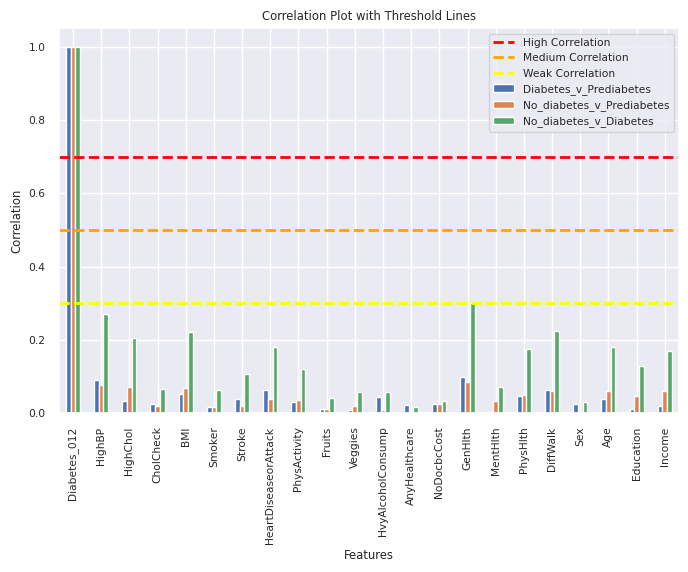

In [31]:
#  @title Create graph
correls2.plot(kind='bar', legend=True, figsize=(8, 5))

plt.axhline(y=0.7, color='red', linestyle='--', linewidth=2, label='High Correlation')
plt.axhline(y=0.5, color='orange', linestyle='--', linewidth=2, label='Medium Correlation')
plt.axhline(y=0.3, color='yellow', linestyle='--', linewidth=2, label='Weak Correlation')
plt.legend()
plt.title('Correlation Plot with Threshold Lines')
plt.xlabel('Features')
plt.ylabel('Correlation')
plt.show()

In [32]:
# @title Drop Diabetes Feature from table
correls_2_drop = correls2.drop(index='Diabetes_012')
correls_2_drop

,Diabetes_v_Prediabetes,No_diabetes_v_Prediabetes,No_diabetes_v_Diabetes
HighBP,0.090034,0.076689,0.269319
HighChol,0.033415,0.071578,0.205684
CholCheck,0.024243,0.021131,0.066037
BMI,0.053257,0.068293,0.222353
Smoker,0.016300,0.018355,0.062212
Stroke,0.039727,0.020900,0.107990
HeartDiseaseorAttack,0.062072,0.039542,0.181258
PhysActivity,0.031884,0.034821,0.121028
Fruits,0.010924,0.012257,0.041736
Veggies,0.009369,0.019700,0.058109


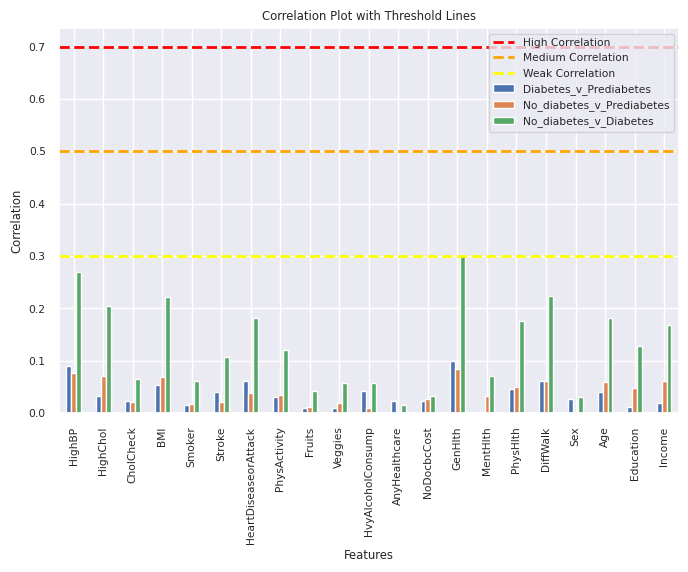

In [33]:
#  @title Create Graph
correls_2_drop.plot(kind='bar', legend=True, figsize=(8, 5))

plt.axhline(y=0.7, color='red', linestyle='--', linewidth=2,
            label='High Correlation')
plt.axhline(y=0.5, color='orange', linestyle='--', linewidth=2,
            label='Medium Correlation')
plt.axhline(y=0.3, color='yellow', linestyle='--', linewidth=2,
            label='Weak Correlation')
plt.legend()
plt.title('Correlation Plot with Threshold Lines')
plt.xlabel('Features')
plt.ylabel('Correlation')
plt.show()

In [34]:
#  @title Select best features
best_features = pd.concat([correls_2_drop.nlargest(3, col) for col in correls_2_drop.columns])

best_features = best_features.drop_duplicates()
best_features

,Diabetes_v_Prediabetes,No_diabetes_v_Prediabetes,No_diabetes_v_Diabetes
GenHlth,0.099243,0.084940,0.300347
HighBP,0.090034,0.076689,0.269319
DiffWalk,0.062485,0.061152,0.223991
HighChol,0.033415,0.071578,0.205684


In [35]:
#  @title Set up a random sample of Diabetes - as there is class imbalance
#  Create the sample size the same as PreDiabetes.  This may be clunky, but is just for initally testing it out.
sample_size = len(pre_d_df)
# Randomly sample rows based on the length of the PreDiabetes set (rather than
# set a set size, in case you want to change and sample PreDiabetes in future).
if len(no_d) >= sample_size:
    sampled_df = no_d.sample(n=sample_size, random_state=42)
else:
    raise ValueError("Insufficient rows to sample")
sampled_df.head(10)

,Diabetes_012,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
162288,0.0,0.0,0.0,1.0,24.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,4.0,0.0,15.0,1.0,0.0,9.0,5.0,5.0
227646,0.0,1.0,0.0,1.0,32.0,1.0,0.0,0.0,1.0,1.0,...,1.0,0.0,3.0,0.0,0.0,0.0,0.0,8.0,6.0,8.0
888,0.0,1.0,1.0,1.0,28.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,3.0,1.0,0.0,0.0,0.0,9.0,6.0,6.0
230094,0.0,1.0,1.0,1.0,28.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,1.0,0.0,0.0,0.0,1.0,9.0,6.0,8.0
134829,0.0,0.0,0.0,1.0,35.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,3.0,10.0,2.0,0.0,0.0,6.0,4.0,8.0
195182,0.0,0.0,0.0,1.0,27.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,1.0,0.0,0.0,0.0,1.0,4.0,4.0,8.0
19665,0.0,0.0,1.0,1.0,43.0,0.0,1.0,0.0,1.0,0.0,...,1.0,1.0,4.0,0.0,6.0,0.0,0.0,7.0,5.0,6.0
25168,0.0,0.0,0.0,1.0,47.0,0.0,0.0,0.0,0.0,1.0,...,1.0,0.0,3.0,1.0,0.0,0.0,0.0,4.0,5.0,6.0
179785,0.0,1.0,1.0,1.0,34.0,0.0,0.0,0.0,1.0,0.0,...,1.0,0.0,2.0,0.0,0.0,0.0,1.0,8.0,4.0,7.0
207057,0.0,0.0,1.0,1.0,33.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,3.0,0.0,0.0,0.0,1.0,11.0,6.0,6.0


In [36]:
#  @title Join the two sets, and inspect the data
sample_df = pd.concat([pre_d_df, sampled_df], ignore_index=True)
sample_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9262 entries, 0 to 9261
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Diabetes_012          9262 non-null   float64
 1   HighBP                9262 non-null   float64
 2   HighChol              9262 non-null   float64
 3   CholCheck             9262 non-null   float64
 4   BMI                   9262 non-null   float64
 5   Smoker                9262 non-null   float64
 6   Stroke                9262 non-null   float64
 7   HeartDiseaseorAttack  9262 non-null   float64
 8   PhysActivity          9262 non-null   float64
 9   Fruits                9262 non-null   float64
 10  Veggies               9262 non-null   float64
 11  HvyAlcoholConsump     9262 non-null   float64
 12  AnyHealthcare         9262 non-null   float64
 13  NoDocbcCost           9262 non-null   float64
 14  GenHlth               9262 non-null   float64
 15  MentHlth             

In [37]:
#  @title Drop out all features that are not the top features
# drop out anything that isn't Gen health, High BP, Diffwalk, HighChol as these were the best features
# Looking at model no diabetes  vs pre diabetes
df3 = sample_df['Diabetes_012'], sample_df['GenHlth'], sample_df['HighBP']
sample_df['HighChol'], sample_df['DiffWalk']
df3 = pd.DataFrame(df3)
df3 = df3.T
df3.head()

,Diabetes_012,GenHlth,HighBP
0,1.0,4.0,1.0
1,1.0,3.0,1.0
2,1.0,2.0,1.0
3,1.0,5.0,1.0
4,1.0,5.0,1.0


In [38]:
# @title Set up X, y and test / train split for modelling
# from sklearn.model_selection import train_test_split

X = df3.drop('Diabetes_012', axis=1)
y = df3['Diabetes_012']

X_train, X_test, y_train, y_test=train_test_split(X, y, test_size=0.40,
                                                  random_state=42)

Best Hyperparameters: {'C': 0.01, 'penalty': 'l1', 'solver': 'liblinear'}
Best Cross-Validation Score (Accuracy): 0.6469265811473234
Training Accuracy: 64.69%


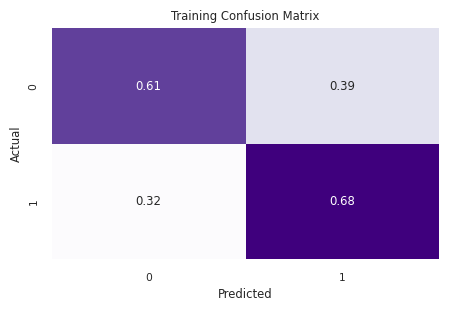

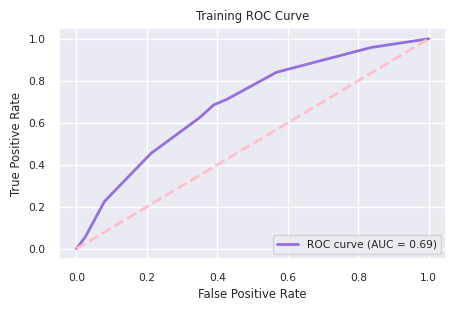

Classification Report for Model:
Training Classification Report:
               precision    recall  f1-score   support

         0.0       0.67      0.61      0.64      2834
         1.0       0.63      0.68      0.66      2723

    accuracy                           0.65      5557
   macro avg       0.65      0.65      0.65      5557
weighted avg       0.65      0.65      0.65      5557

AUC Scores
Training AUC Score: 0.69
Validation Accuracy: 64.45%


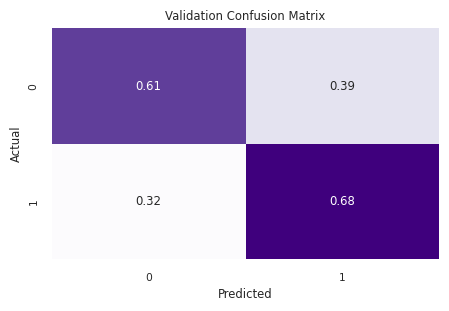

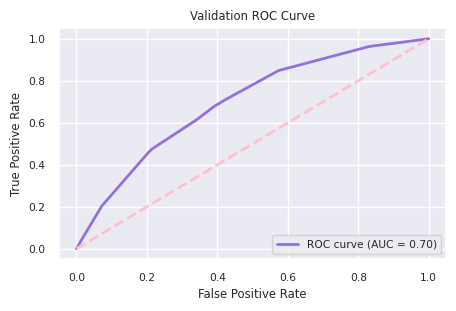

Classification Report for Model:
Validation Classification Report:
               precision    recall  f1-score   support

         0.0       0.64      0.61      0.62      1797
         1.0       0.65      0.68      0.66      1908

    accuracy                           0.64      3705
   macro avg       0.64      0.64      0.64      3705
weighted avg       0.64      0.64      0.64      3705

AUC Scores
Validation AUC Score: 0.70


In [39]:
#  @title Logistic Regression Model

log_reg = LogisticRegression(solver='liblinear', max_iter=100)

# set the grid for hyper tuning later
param_grid = {
    'C': [0.01, 0.1, 1, 10, 100],
    'penalty': ['l1', 'l2'],  # 'liblinear' supports both l1 and l2 penalties
    'solver': ['liblinear']  # 'liblinear' supports both l1 and l2 penalties
}

# GridSearchCV
grid_search = GridSearchCV(log_reg, param_grid, cv=5, scoring='accuracy', n_jobs=-1)
grid_search.fit(X_train, y_train)

# Retrieve the best model and best paramss
best_model = grid_search.best_estimator_
best_params = grid_search.best_params_
print("=" * 62)

# Print the best hyperparameters
print("Best Hyperparameters:", best_params)
#  Print the best cross-val score
print("Best Cross-Validation Score (Accuracy):", grid_search.best_score_)
# Predict and plot training
predict_and_plot(best_model, X_train, y_train, 'Training')
# Predict and plot validation
predict_and_plot(best_model, X_test, y_test, 'Validation')
print("=" * 62)

Best Hyperparameters:
{'algorithm': 'brute', 'n_neighbors': 11, 'weights': 'uniform'}
Cross-Validation Scores: [0.64252336 0.63317757 0.66588785 0.6588785  0.67523364 0.60747664
 0.63700234 0.6323185  0.61592506 0.64871194 0.62529274 0.61358314
 0.6323185 ]
Mean Cross-Validation Score: 0.64
Standard Deviation of Cross-Validation Score: 0.02
Training Accuracy: 0.6368544178513587
Validation Accuracy: 0.6385964912280702
Training Accuracy: 63.69%


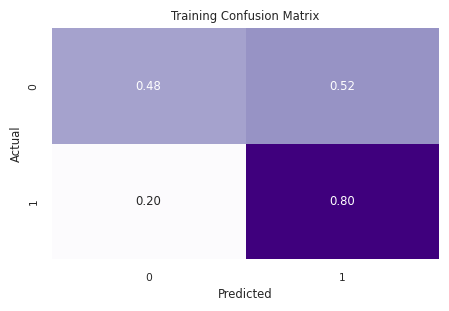

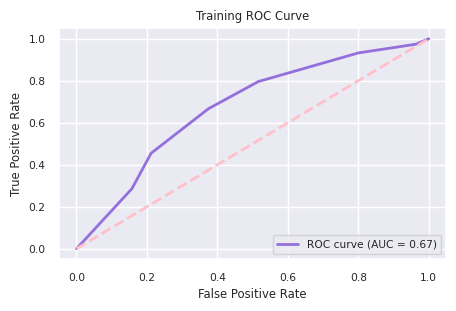

Classification Report for Model:
Training Classification Report:
               precision    recall  f1-score   support

         0.0       0.71      0.48      0.58      2834
         1.0       0.60      0.80      0.68      2723

    accuracy                           0.64      5557
   macro avg       0.65      0.64      0.63      5557
weighted avg       0.66      0.64      0.63      5557

AUC Scores
Training AUC Score: 0.67
Validation Accuracy: 63.86%


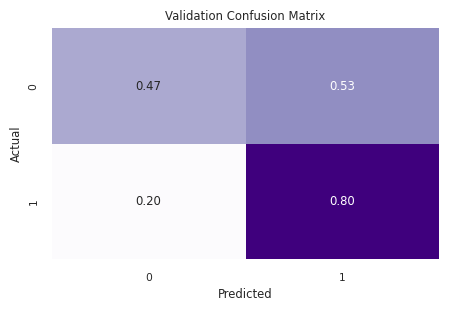

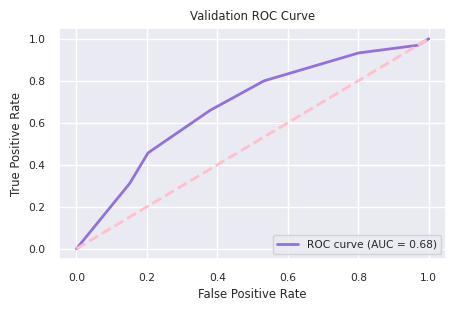

Classification Report for Model:
Validation Classification Report:
               precision    recall  f1-score   support

         0.0       0.69      0.47      0.56      1797
         1.0       0.61      0.80      0.69      1908

    accuracy                           0.64      3705
   macro avg       0.65      0.63      0.63      3705
weighted avg       0.65      0.64      0.63      3705

AUC Scores
Validation AUC Score: 0.68


In [40]:
#  @title KNN Model

# params
param_grid = {
    'n_neighbors': [1, 3, 5, 7, 9, 11, 13, 15, 17],
    'weights': ['uniform', 'distance'],
    'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute']
}

knn_model = KNeighborsClassifier()

# GridSearchCV
grid_search = GridSearchCV(knn_model, param_grid, cv=13, scoring='accuracy')
grid_search.fit(X_train, y_train)

# Best hyperparameters
print("=" * 62)
print("Best Hyperparameters:")
print(grid_search.best_params_)
print("=" * 62)
best_model = grid_search.best_estimator_

# Cross-validation best scores
cv_scores = cross_val_score(best_model, X_train, y_train, cv=13, scoring='accuracy')
print(f"Cross-Validation Scores: {cv_scores}")
print(f"Mean Cross-Validation Score: {cv_scores.mean():.2f}")
print(f"Standard Deviation of Cross-Validation Score: {cv_scores.std():.2f}")
print("=" * 62)

y_train_pred = best_model.predict(X_train)
y_val_pred = best_model.predict(X_test)

train_accuracy = accuracy_score(y_train, y_train_pred)
val_accuracy = accuracy_score(y_test, y_val_pred)

print("Training Accuracy:", train_accuracy)
print("Validation Accuracy:", val_accuracy)

# Evaluate and plot for training and validation sets
predict_and_plot(best_model, X_train, y_train, 'Training')
predict_and_plot(best_model, X_test, y_test, 'Validation')

Best Hyperparameters:
{'algorithm': 'brute', 'n_neighbors': 11, 'weights': 'uniform'}
Cross-Validation Scores: [0.64018692 0.63551402 0.67056075 0.65186916 0.71028037 0.61682243
 0.6557377  0.64168618 0.62295082 0.65105386 0.66978923 0.63700234
 0.60655738]
Mean Cross-Validation Score: 0.65
Standard Deviation of Cross-Validation Score: 0.03
Training Accuracy: 64.69%


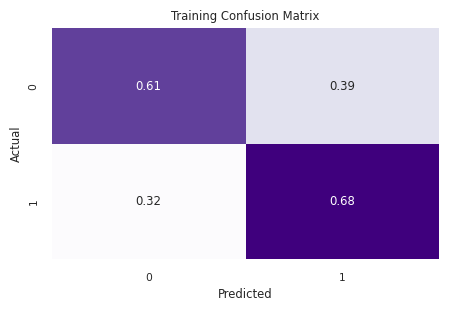

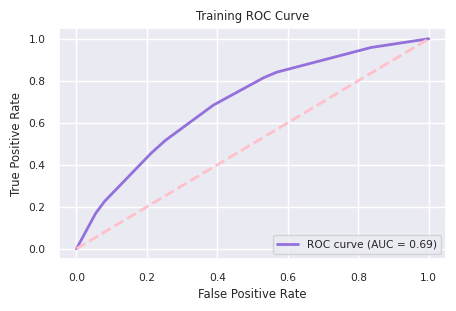

Classification Report for Model:
Training Classification Report:
               precision    recall  f1-score   support

         0.0       0.67      0.61      0.64      2834
         1.0       0.63      0.68      0.66      2723

    accuracy                           0.65      5557
   macro avg       0.65      0.65      0.65      5557
weighted avg       0.65      0.65      0.65      5557

AUC Scores
Training AUC Score: 0.69
Validation Accuracy: 64.45%


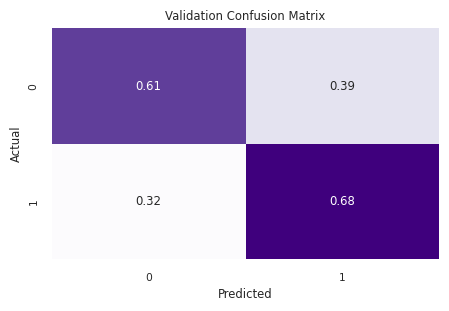

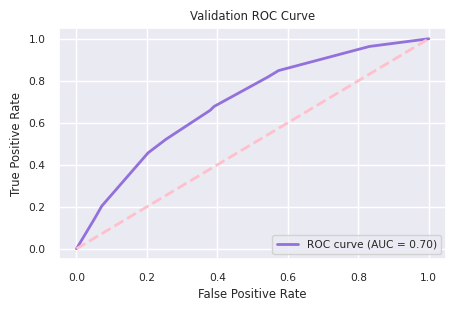

Classification Report for Model:
Validation Classification Report:
               precision    recall  f1-score   support

         0.0       0.64      0.61      0.62      1797
         1.0       0.65      0.68      0.66      1908

    accuracy                           0.64      3705
   macro avg       0.64      0.64      0.64      3705
weighted avg       0.64      0.64      0.64      3705

AUC Scores
Validation AUC Score: 0.70


In [41]:
# @title Random Forrest Model
# parameter grid
param_grid2 = {
    'n_estimators': [5, 10, 15, 20, 25, 50, 100, 150],
    'max_depth': [None, 5, 10, 15, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'bootstrap': [True, False],
    'criterion': ['gini', 'entropy']
}

model_2 = RandomForestClassifier(random_state=42, n_jobs=-1)

# GridSearchCV
grid_search2 = GridSearchCV(estimator=model_2, param_grid=param_grid2, cv=13, scoring='accuracy', n_jobs=-1)
grid_search2.fit(X_train, y_train)

# best params
print("=" * 62)
print("Best Hyperparameters:")
print(grid_search.best_params_)
print("=" * 62)

# Use best estim.
best_model2 = grid_search2.best_estimator_

# Dscores - cross-val
cv_scores2 = cross_val_score(best_model2, X_train, y_train, cv=13, scoring='accuracy')
print(f"Cross-Validation Scores: {cv_scores2}")
print(f"Mean Cross-Validation Score: {cv_scores2.mean():.2f}")
print(f"Standard Deviation of Cross-Validation Score: {cv_scores2.std():.2f}")
print("=" * 62)

# Evaluate plot training data
predict_and_plot(best_model2, X_train, y_train, 'Training')

# Evaluate plot test data
predict_and_plot(best_model2, X_test, y_test, 'Validation')

Best Hyperparameters:
{'algorithm': 'brute', 'n_neighbors': 11, 'weights': 'uniform'}
Cross-Validation Scores: [0.64298561 0.67985612 0.63636364 0.64086409 0.63456346]
Mean Cross-Validation Score: 0.65
Standard Deviation of Cross-Validation Score: 0.02
Training Accuracy: 0.6469317977325896
Validation Accuracy: 0.6445344129554655
Training Accuracy: 64.69%


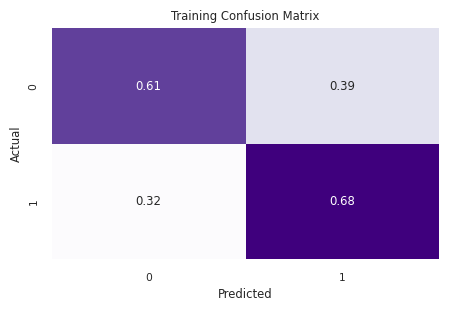

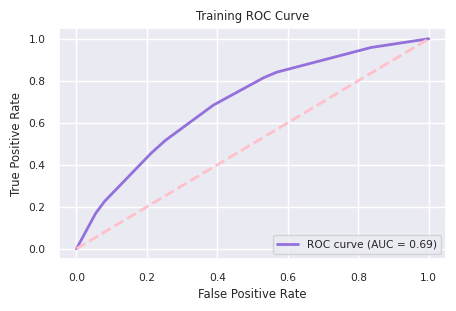

Classification Report for Model:
Training Classification Report:
               precision    recall  f1-score   support

         0.0       0.67      0.61      0.64      2834
         1.0       0.63      0.68      0.66      2723

    accuracy                           0.65      5557
   macro avg       0.65      0.65      0.65      5557
weighted avg       0.65      0.65      0.65      5557

AUC Scores
Training AUC Score: 0.69
Validation Accuracy: 64.45%


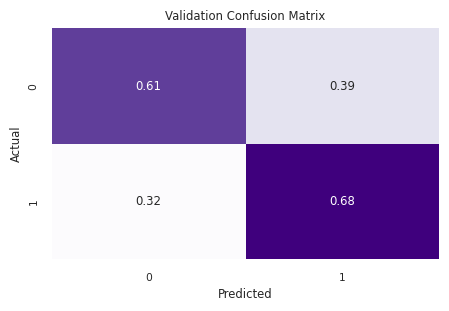

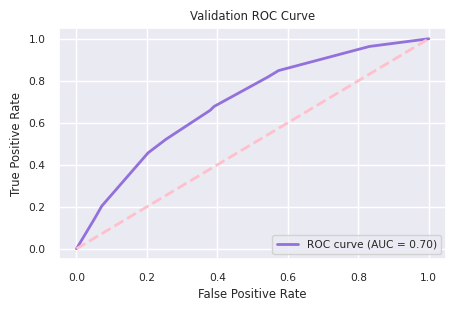

Classification Report for Model:
Validation Classification Report:
               precision    recall  f1-score   support

         0.0       0.64      0.61      0.62      1797
         1.0       0.65      0.68      0.66      1908

    accuracy                           0.64      3705
   macro avg       0.64      0.64      0.64      3705
weighted avg       0.64      0.64      0.64      3705

AUC Scores
Validation AUC Score: 0.70


In [42]:
#  @title Decision Tree Models

# param grid
param_grid3 = {
    'max_depth': [None, 5, 10, 15, 20],
    'min_samples_split': [2, 5, 10, 15, 20, 25],
    'min_samples_leaf': [1, 3, 5, 7],
    'criterion': ['gini', 'entropy']
}

decision_tree_model = DecisionTreeClassifier(random_state=42)

# GridSearchCV
grid_search3 = GridSearchCV(estimator=decision_tree_model, param_grid=param_grid3, cv=5, n_jobs=-1, scoring='accuracy')
grid_search3.fit(X_train, y_train)

# best hyperparameters
print("=" * 62)
print("Best Hyperparameters:")
print(grid_search.best_params_)
print("=" * 62)
best_model3 = grid_search3.best_estimator_

# cross-validation scores
cv_scores3 = cross_val_score(best_model3, X_train, y_train, cv=5, scoring='accuracy')
print(f"Cross-Validation Scores: {cv_scores3}")
print(f"Mean Cross-Validation Score: {cv_scores3.mean():.2f}")
print(f"Standard Deviation of Cross-Validation Score: {cv_scores3.std():.2f}")
print("=" * 62)

# Fit best model
best_model3.fit(X_train, y_train)

# training and validation accuracy
train_accuracy = best_model3.score(X_train, y_train)
val_accuracy = best_model3.score(X_test, y_test)
print("=" * 62)
print("Training Accuracy:", train_accuracy)
print("Validation Accuracy:", val_accuracy)
print("=" * 62)
# plot training data
predict_and_plot(best_model3, X_train, y_train, 'Training')

# plot val data
predict_and_plot(best_model3, X_test, y_test, 'Validation')

Best Hyperparameters: {'C': 0.1, 'gamma': 'scale', 'kernel': 'linear'}
Cross-Validation Scores: [0.62383178 0.61214953 0.64719626 0.61214953 0.73598131 0.62616822
 0.61826698 0.62997658 0.59250585 0.63466042 0.6323185  0.6323185
 0.5971897 ]
Mean Cross-Validation Score: 0.63
Standard Deviation of Cross-Validation Score: 0.03
Training Accuracy: 63.04%


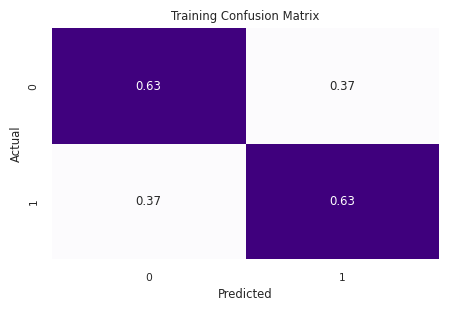

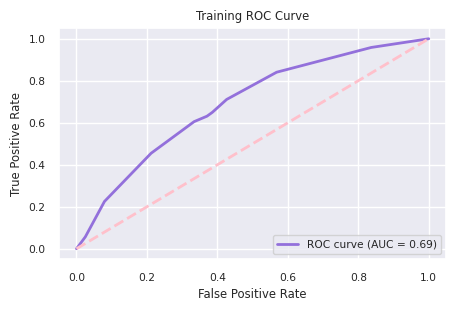

Classification Report for Model:
Training Classification Report:
               precision    recall  f1-score   support

         0.0       0.64      0.63      0.63      2834
         1.0       0.62      0.63      0.63      2723

    accuracy                           0.63      5557
   macro avg       0.63      0.63      0.63      5557
weighted avg       0.63      0.63      0.63      5557

AUC Scores
Training AUC Score: 0.69
Validation Accuracy: 63.29%


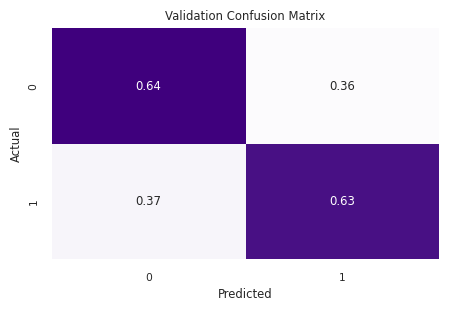

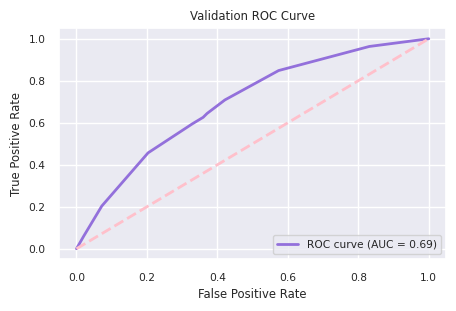

Classification Report for Model:
Validation Classification Report:
               precision    recall  f1-score   support

         0.0       0.62      0.64      0.63      1797
         1.0       0.65      0.63      0.64      1908

    accuracy                           0.63      3705
   macro avg       0.63      0.63      0.63      3705
weighted avg       0.63      0.63      0.63      3705

AUC Scores
Validation AUC Score: 0.69


In [43]:
#  @title SVR model

# setup
svm_model = SVC(kernel='linear', probability=True, class_weight='balanced')  # prob for ROC

# params
param_grid4 = {
    'C': [0.1, 1, 10, 100],  # Regs
    'kernel': ['linear'],     # Kernel
    'gamma': ['scale', 'auto']  # coeff-K
}

# GridSearchCV
grid_search4 = GridSearchCV(svm_model, param_grid4, cv=13, scoring='accuracy')
grid_search4.fit(X_train, y_train)

# best model
best_model4 = grid_search4.best_estimator_
best_params4 = grid_search4.best_params_

# best
print("=" * 62)
print("Best Hyperparameters:", best_params4)
print("=" * 62)

# cross-vals
cv_scores = cross_val_score(best_model4, X_train, y_train, cv=13, scoring='accuracy')
print(f"Cross-Validation Scores: {cv_scores}")
print(f"Mean Cross-Validation Score: {cv_scores.mean():.2f}")
print(f"Standard Deviation of Cross-Validation Score: {cv_scores.std():.2f}")
print("=" * 62)

best_model4.fit(X_train, y_train)
predict_and_plot(best_model4, X_train, y_train, name='Training')
predict_and_plot(best_model4, X_test, y_test, name='Validation')
print("=" * 62)

Best Hyperparameters: {'learning_rate': 0.1, 'n_estimators': 20}
Best Cross-Validation Score (Accuracy): 0.6469239355710936
AdaBoost Training Accuracy: 64.69%


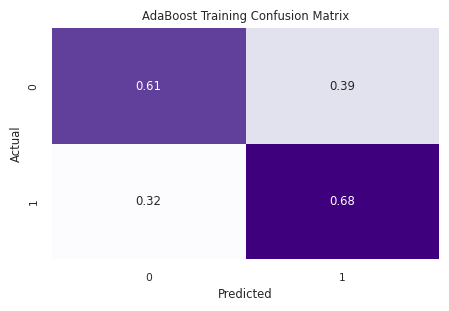

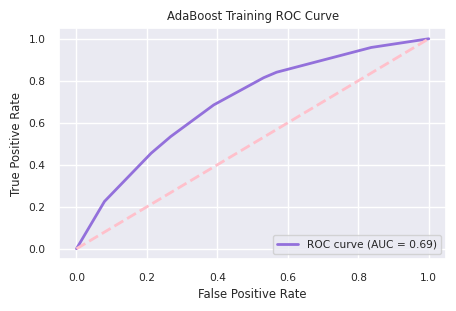

Classification Report for Model:
AdaBoost Training Classification Report:
               precision    recall  f1-score   support

         0.0       0.67      0.61      0.64      2834
         1.0       0.63      0.68      0.66      2723

    accuracy                           0.65      5557
   macro avg       0.65      0.65      0.65      5557
weighted avg       0.65      0.65      0.65      5557

AUC Scores
AdaBoost Training AUC Score: 0.69
AdaBoost Validation Accuracy: 64.45%


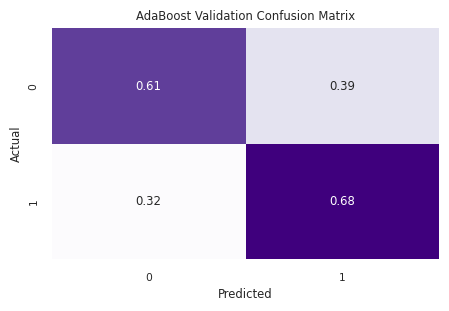

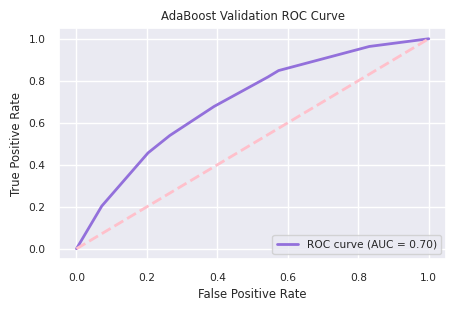

Classification Report for Model:
AdaBoost Validation Classification Report:
               precision    recall  f1-score   support

         0.0       0.64      0.61      0.62      1797
         1.0       0.65      0.68      0.66      1908

    accuracy                           0.64      3705
   macro avg       0.64      0.64      0.64      3705
weighted avg       0.64      0.64      0.64      3705

AUC Scores
AdaBoost Validation AUC Score: 0.70


In [44]:
#  @title AdaBoost Model

# There are issues with AdaBoost and not using SAMME due to deprectation, so need to set it as SAMME algorithm explicitly
adaboost_model = AdaBoostClassifier(algorithm='SAMME', random_state=42)

# params
param_grid6 = {
    'n_estimators': [5, 10, 15, 20, 25, 50, 100, 150],
    'learning_rate': [0.01, 0.1, 1]
}

# GridSearchCV
grid_search6 = GridSearchCV(adaboost_model, param_grid6, cv=13, n_jobs=-1, scoring='accuracy')
grid_search6.fit(X_train, y_train)

best_model6 = grid_search6.best_estimator_
best_params6 = grid_search6.best_params_

# Print best options
print("=" * 62)
print("Best Hyperparameters:", best_params6)
print("Best Cross-Validation Score (Accuracy):", grid_search6.best_score_)

best_model6.fit(X_train, y_train)
predict_and_plot(best_model6, X_train, y_train, name='AdaBoost Training')
predict_and_plot(best_model6, X_test, y_test, name='AdaBoost Validation')

Best Hyperparameters: {'var_smoothing': 1e-09}
Best Cross-Validation Score (Accuracy): 0.6469239355710936
Naive Bayes Training Accuracy: 64.69%


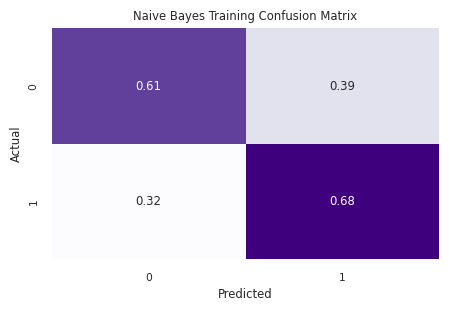

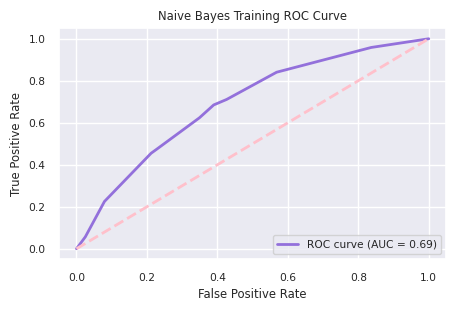

Classification Report for Model:
Naive Bayes Training Classification Report:
               precision    recall  f1-score   support

         0.0       0.67      0.61      0.64      2834
         1.0       0.63      0.68      0.66      2723

    accuracy                           0.65      5557
   macro avg       0.65      0.65      0.65      5557
weighted avg       0.65      0.65      0.65      5557

AUC Scores
Naive Bayes Training AUC Score: 0.69
Naive Bayes Validation Accuracy: 64.45%


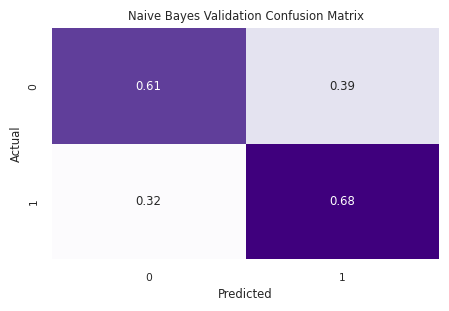

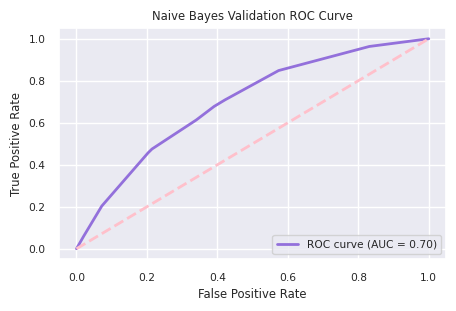

Classification Report for Model:
Naive Bayes Validation Classification Report:
               precision    recall  f1-score   support

         0.0       0.64      0.61      0.62      1797
         1.0       0.65      0.68      0.66      1908

    accuracy                           0.64      3705
   macro avg       0.64      0.64      0.64      3705
weighted avg       0.64      0.64      0.64      3705

AUC Scores
Naive Bayes Validation AUC Score: 0.70


In [45]:
#  @title Naive Bayes Model

nb_model = GaussianNB()

# params
param_grid5 = {
    'var_smoothing': [1e-9, 1e-8, 1e-7, 1e-6, 1e-5, 1e-4, 1e-3]
}

# GridSearchCV
grid_search5 = GridSearchCV(nb_model, param_grid5, cv=13, n_jobs=-1, scoring='accuracy')
grid_search5.fit(X_train, y_train)

# get the best
best_model5 = grid_search5.best_estimator_
best_params5 = grid_search5.best_params_

# Print it out
print("=" * 62)
print("Best Hyperparameters:", best_params5)
print("Best Cross-Validation Score (Accuracy):", grid_search5.best_score_)
print("=" * 62)

best_model5.fit(X_train, y_train)
predict_and_plot(best_model5, X_train, y_train, name='Naive Bayes Training')
predict_and_plot(best_model5, X_test, y_test, name='Naive Bayes Validation')

Best Hyperparameters: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 50}
Best Cross-Validation Score (Accuracy): 0.6469239355710936
GBM Training Accuracy: 64.69%


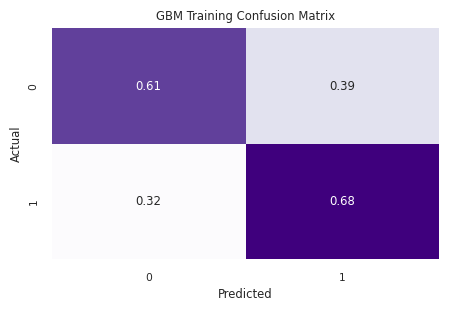

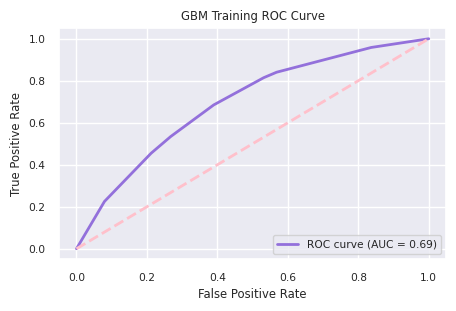

Classification Report for Model:
GBM Training Classification Report:
               precision    recall  f1-score   support

         0.0       0.67      0.61      0.64      2834
         1.0       0.63      0.68      0.66      2723

    accuracy                           0.65      5557
   macro avg       0.65      0.65      0.65      5557
weighted avg       0.65      0.65      0.65      5557

AUC Scores
GBM Training AUC Score: 0.69
GBM Validation Accuracy: 64.45%


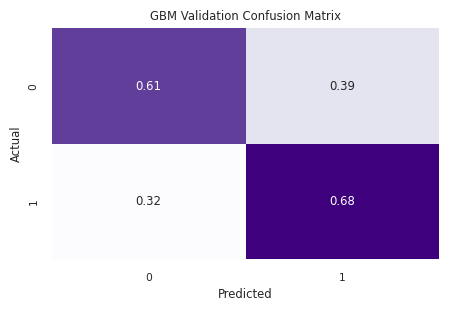

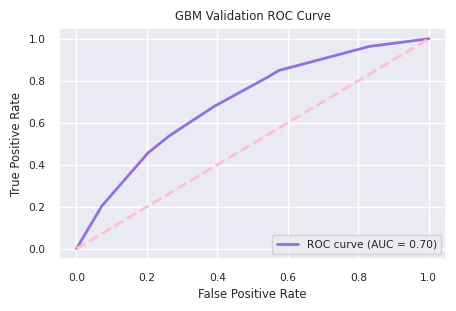

Classification Report for Model:
GBM Validation Classification Report:
               precision    recall  f1-score   support

         0.0       0.64      0.61      0.62      1797
         1.0       0.65      0.68      0.66      1908

    accuracy                           0.64      3705
   macro avg       0.64      0.64      0.64      3705
weighted avg       0.64      0.64      0.64      3705

AUC Scores
GBM Validation AUC Score: 0.70


In [46]:
#  @title Gradient Boost

gbm_model = GradientBoostingClassifier(n_estimators=100, max_depth=3, random_state=42)

# params
param_grid7 = {
    'n_estimators': [5, 10, 15, 20, 25, 50, 100, 150],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.2],
}

# GridSearchCV
grid_search7 = GridSearchCV(gbm_model, param_grid7, cv=13, n_jobs=-1, scoring='accuracy')
grid_search7.fit(X_train, y_train)

# best models
best_model7 = grid_search7.best_estimator_
best_params7 = grid_search7.best_params_

# Print the best
print("=" * 62)
print("Best Hyperparameters:", best_params7)
print("Best Cross-Validation Score (Accuracy):", grid_search7.best_score_)

# Train
best_model7.fit(X_train, y_train)
predict_and_plot(best_model7, X_train, y_train, name='GBM Training')
predict_and_plot(best_model7, X_test, y_test, name='GBM Validation')
print("=" * 62)

Best Hyperparameters: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 50}
Best Cross-Validation Score (Accuracy): 0.6469239355710936
XGBoost Training Accuracy: 64.69%


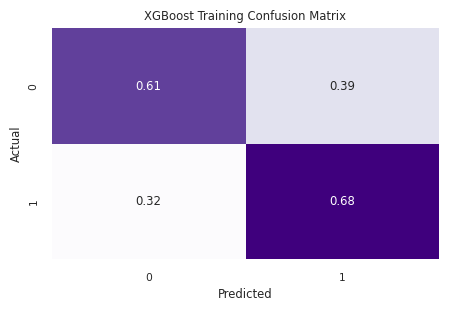

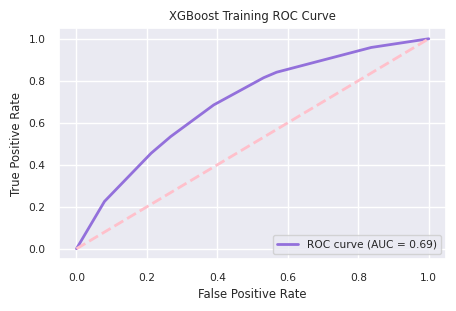

Classification Report for Model:
XGBoost Training Classification Report:
               precision    recall  f1-score   support

         0.0       0.67      0.61      0.64      2834
         1.0       0.63      0.68      0.66      2723

    accuracy                           0.65      5557
   macro avg       0.65      0.65      0.65      5557
weighted avg       0.65      0.65      0.65      5557

AUC Scores
XGBoost Training AUC Score: 0.69
XGBoost Validation Accuracy: 64.45%


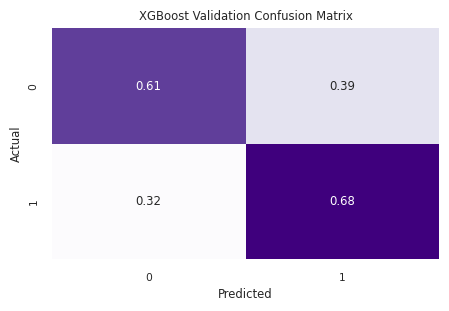

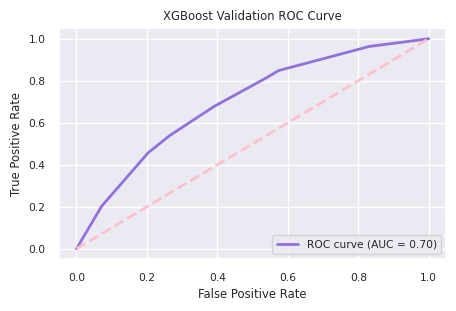

Classification Report for Model:
XGBoost Validation Classification Report:
               precision    recall  f1-score   support

         0.0       0.64      0.61      0.62      1797
         1.0       0.65      0.68      0.66      1908

    accuracy                           0.64      3705
   macro avg       0.64      0.64      0.64      3705
weighted avg       0.64      0.64      0.64      3705

AUC Scores
XGBoost Validation AUC Score: 0.70


In [47]:
#  @title XGBoost Model

xgboost_model = XGBClassifier(n_estimators=100, max_depth=3, random_state=42)

# params
param_grid8 = {
    'n_estimators': [5, 10, 15, 20, 25, 50, 100, 150],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.2],
}

# GridSearchCV
grid_search8 = GridSearchCV(xgboost_model, param_grid8, cv=13, n_jobs=-1, scoring='accuracy')
grid_search8.fit(X_train, y_train)

# best mods
best_model8 = grid_search8.best_estimator_
best_params8 = grid_search8.best_params_

# Print the best!
print("=" * 62)
print("Best Hyperparameters:", best_params8)
print("Best Cross-Validation Score (Accuracy):", grid_search8.best_score_)

best_model8.fit(X_train, y_train)
predict_and_plot(best_model8, X_train, y_train, name='XGBoost Training')
predict_and_plot(best_model8, X_test, y_test, name='XGBoost Validation')

Best Hyperparameters: {'reg_param': 0.0, 'store_covariance': True}
Best Cross-Validation Score (Accuracy): 0.6469239355710936
QDA Training Accuracy: 64.69%


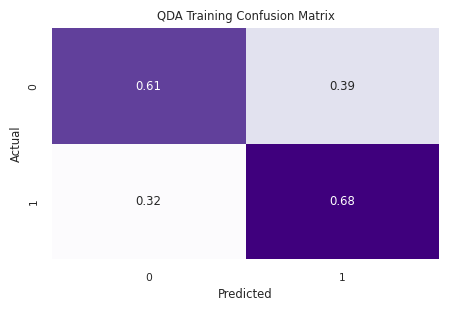

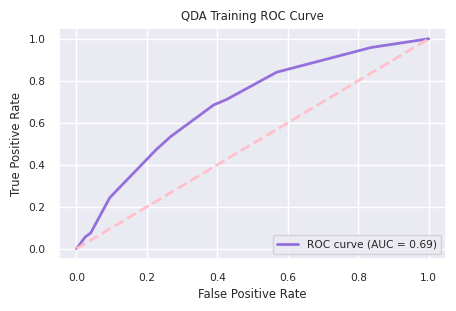

Classification Report for Model:
QDA Training Classification Report:
               precision    recall  f1-score   support

         0.0       0.67      0.61      0.64      2834
         1.0       0.63      0.68      0.66      2723

    accuracy                           0.65      5557
   macro avg       0.65      0.65      0.65      5557
weighted avg       0.65      0.65      0.65      5557

AUC Scores
QDA Training AUC Score: 0.69
QDA Validation Accuracy: 64.45%


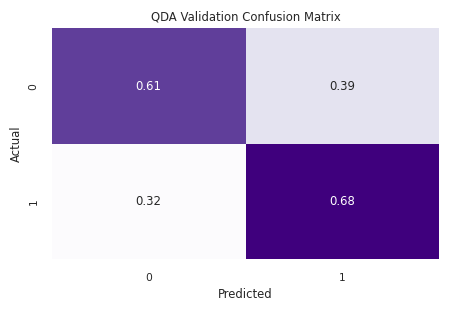

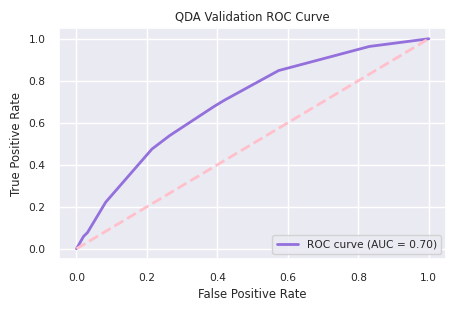

Classification Report for Model:
QDA Validation Classification Report:
               precision    recall  f1-score   support

         0.0       0.64      0.61      0.62      1797
         1.0       0.65      0.68      0.66      1908

    accuracy                           0.64      3705
   macro avg       0.64      0.64      0.64      3705
weighted avg       0.64      0.64      0.64      3705

AUC Scores
QDA Validation AUC Score: 0.70


In [48]:
# @title QDA Model

qda_model = QuadraticDiscriminantAnalysis()

# params
param_grid9 = {
    'reg_param': [0.0, 0.1, 0.5, 1.0],  # Regs
    'store_covariance': [True, False]    # if to store the covariance matrix
}

# GridSearchCV
grid_search9 = GridSearchCV(qda_model, param_grid9, cv=13, n_jobs=-1, scoring='accuracy')
grid_search9.fit(X_train, y_train)

# get the best!
best_model9 = grid_search9.best_estimator_
best_params9 = grid_search9.best_params_

# Print the best!
print("=" * 62)
print("Best Hyperparameters:", best_params9)
print("Best Cross-Validation Score (Accuracy):", grid_search9.best_score_)
print("=" * 62)

best_model9.fit(X_train, y_train)
predict_and_plot(best_model9, X_train, y_train, name='QDA Training')
predict_and_plot(best_model9, X_test, y_test, name='QDA Validation')

Best Hyperparameters: {'solver': 'svd'}
Best Cross-Validation Score (Accuracy): 0.6469239355710936
LDA Training Accuracy: 64.69%


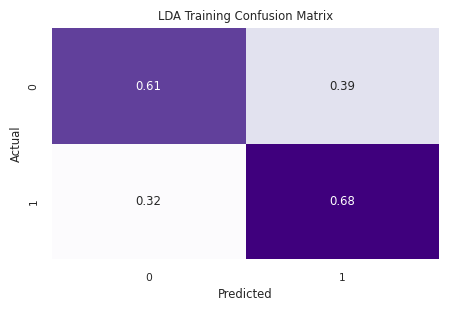

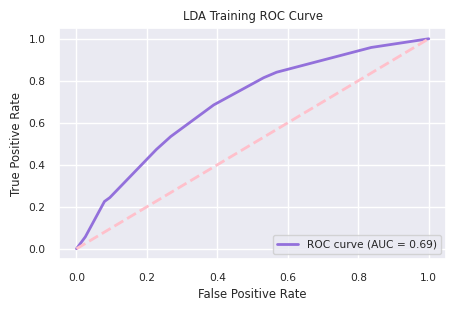

Classification Report for Model:
LDA Training Classification Report:
               precision    recall  f1-score   support

         0.0       0.67      0.61      0.64      2834
         1.0       0.63      0.68      0.66      2723

    accuracy                           0.65      5557
   macro avg       0.65      0.65      0.65      5557
weighted avg       0.65      0.65      0.65      5557

AUC Scores
LDA Training AUC Score: 0.69
LDA Validation Accuracy: 64.45%


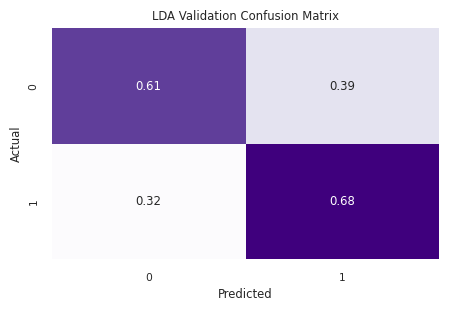

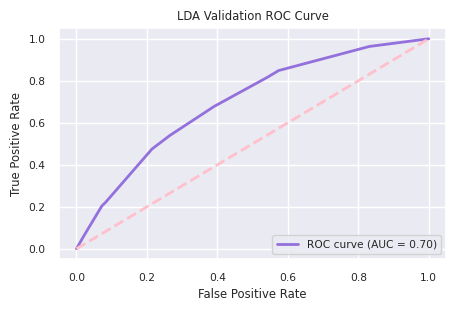

Classification Report for Model:
LDA Validation Classification Report:
               precision    recall  f1-score   support

         0.0       0.64      0.61      0.62      1797
         1.0       0.65      0.68      0.66      1908

    accuracy                           0.64      3705
   macro avg       0.64      0.64      0.64      3705
weighted avg       0.64      0.64      0.64      3705

AUC Scores
LDA Validation AUC Score: 0.70


In [49]:
# @title LDA Model

lda_model = LinearDiscriminantAnalysis()

# params
param_grid10 = [
    {'solver': ['svd']},  # 'svd' does not support shrinkage
    {'solver': ['lsqr', 'eigen'], 'shrinkage': [None, 0.1, 0.5, 1.0]}  # Only for 'lsqr' and 'eigen'
]

# GridSearchCV
grid_search10 = GridSearchCV(lda_model, param_grid10, cv=13, n_jobs=-1, scoring='accuracy')
grid_search10.fit(X_train, y_train)

# Get the best
best_model10 = grid_search10.best_estimator_
best_params10 = grid_search10.best_params_

# Print the best
print("=" * 62)
print("Best Hyperparameters:", best_params10)
print("Best Cross-Validation Score (Accuracy):", grid_search10.best_score_)
print("=" * 62)

best_model10.fit(X_train, y_train)
predict_and_plot(best_model10, X_train, y_train, name='LDA Training')
predict_and_plot(best_model10, X_test, y_test, name='LDA Validation')

In [102]:
#  @title Run with all features to try - overfitting
# drop out anything that isn't Gen health, High BP, Diffwalk, HighChol as these were the best features
# Looking at model no diabetes  vs pre diabetes
df3 = sample_df

X = df3.drop('Diabetes_012', axis=1)
y = df3['Diabetes_012']

X_train, X_test, y_train, y_test=train_test_split(X, y, test_size=0.40,
                                                  random_state=42)

Best Hyperparameters: {'C': 1, 'penalty': 'l1', 'solver': 'liblinear'}
Best Cross-Validation Score (Accuracy): 0.6854386158040264
Training Accuracy: 68.80%


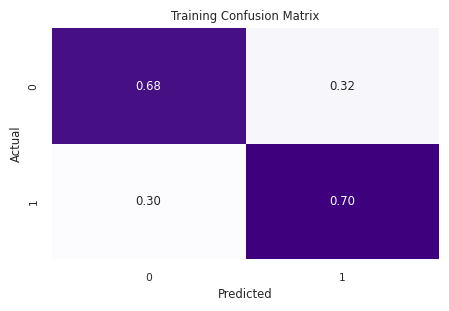

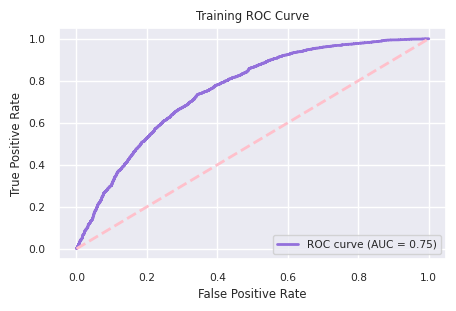

Classification Report for Model:
Training Classification Report:
               precision    recall  f1-score   support

         0.0       0.70      0.68      0.69      2834
         1.0       0.68      0.70      0.69      2723

    accuracy                           0.69      5557
   macro avg       0.69      0.69      0.69      5557
weighted avg       0.69      0.69      0.69      5557

AUC Scores
Training AUC Score: 0.75
Validation Accuracy: 69.10%


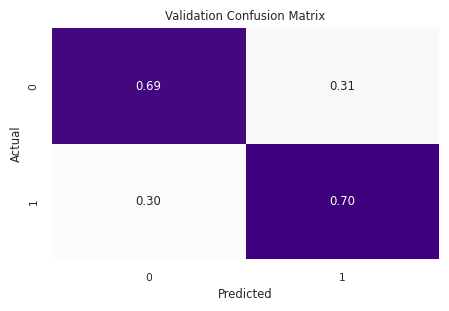

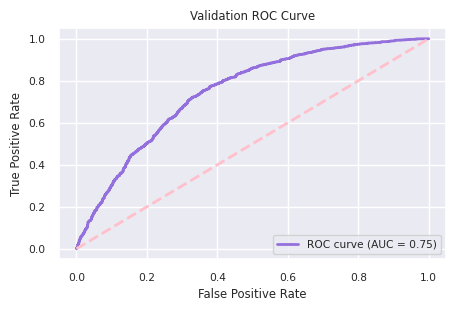

Classification Report for Model:
Validation Classification Report:
               precision    recall  f1-score   support

         0.0       0.68      0.69      0.68      1797
         1.0       0.70      0.70      0.70      1908

    accuracy                           0.69      3705
   macro avg       0.69      0.69      0.69      3705
weighted avg       0.69      0.69      0.69      3705

AUC Scores
Validation AUC Score: 0.75


In [103]:
#  @title Logistic Regression Model

log_reg = LogisticRegression(solver='liblinear', max_iter=100)

# set the grid for hyper tuning later
param_grid = {
    'C': [0.01, 0.1, 1, 10, 100],
    'penalty': ['l1', 'l2'],  # 'liblinear' supports both l1 and l2 penalties
    'solver': ['liblinear']  # 'liblinear' supports both l1 and l2 penalties
}

# GridSearchCV
grid_search = GridSearchCV(log_reg, param_grid, cv=5, scoring='accuracy', n_jobs=-1)
grid_search.fit(X_train, y_train)

# Retrieve the best model and best paramss
best_model = grid_search.best_estimator_
best_params = grid_search.best_params_
print("=" * 62)

# Print the best hyperparameters
print("Best Hyperparameters:", best_params)
#  Print the best cross-val score
print("Best Cross-Validation Score (Accuracy):", grid_search.best_score_)
# Predict and plot training
predict_and_plot(best_model, X_train, y_train, 'Training')
# Predict and plot validation
predict_and_plot(best_model, X_test, y_test, 'Validation')
print("=" * 62)

Best Hyperparameters:
{'algorithm': 'kd_tree', 'n_neighbors': 17, 'weights': 'distance'}
Cross-Validation Scores: [0.67523364 0.6635514  0.6682243  0.6588785  0.6682243  0.67523364
 0.6557377  0.69555035 0.63466042 0.61124122 0.68852459 0.70023419
 0.6557377 ]
Mean Cross-Validation Score: 0.67
Standard Deviation of Cross-Validation Score: 0.02
Training Accuracy: 0.9991002339391758
Validation Accuracy: 0.6628879892037787
Training Accuracy: 99.91%


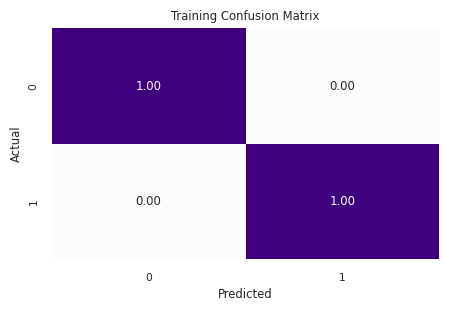

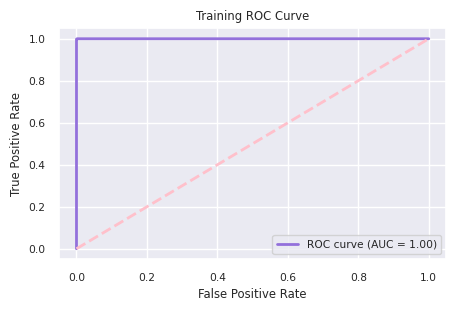

Classification Report for Model:
Training Classification Report:
               precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      2834
         1.0       1.00      1.00      1.00      2723

    accuracy                           1.00      5557
   macro avg       1.00      1.00      1.00      5557
weighted avg       1.00      1.00      1.00      5557

AUC Scores
Training AUC Score: 1.00
Validation Accuracy: 66.29%


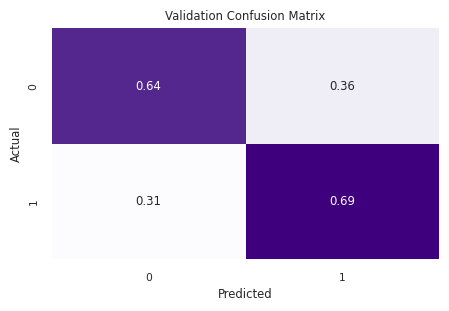

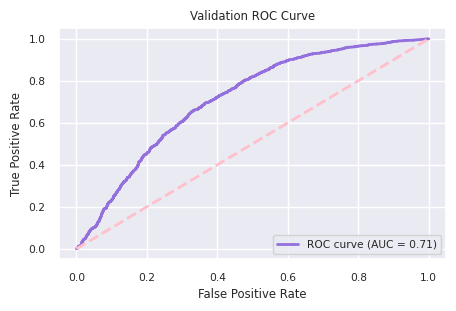

Classification Report for Model:
Validation Classification Report:
               precision    recall  f1-score   support

         0.0       0.66      0.64      0.65      1797
         1.0       0.67      0.69      0.68      1908

    accuracy                           0.66      3705
   macro avg       0.66      0.66      0.66      3705
weighted avg       0.66      0.66      0.66      3705

AUC Scores
Validation AUC Score: 0.71


In [104]:
#  @title KNN Model

# params
param_grid = {
    'n_neighbors': [1, 3, 5, 7, 9, 11, 13, 15, 17],
    'weights': ['uniform', 'distance'],
    'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute']
}

knn_model = KNeighborsClassifier()

# GridSearchCV
grid_search = GridSearchCV(knn_model, param_grid, cv=13, scoring='accuracy')
grid_search.fit(X_train, y_train)

# Best hyperparameters
print("=" * 62)
print("Best Hyperparameters:")
print(grid_search.best_params_)
print("=" * 62)
best_model = grid_search.best_estimator_

# Cross-validation best scores
cv_scores = cross_val_score(best_model, X_train, y_train, cv=13, scoring='accuracy')
print(f"Cross-Validation Scores: {cv_scores}")
print(f"Mean Cross-Validation Score: {cv_scores.mean():.2f}")
print(f"Standard Deviation of Cross-Validation Score: {cv_scores.std():.2f}")
print("=" * 62)

y_train_pred = best_model.predict(X_train)
y_val_pred = best_model.predict(X_test)

train_accuracy = accuracy_score(y_train, y_train_pred)
val_accuracy = accuracy_score(y_test, y_val_pred)

print("Training Accuracy:", train_accuracy)
print("Validation Accuracy:", val_accuracy)

# Evaluate and plot for training and validation sets
predict_and_plot(best_model, X_train, y_train, 'Training')
predict_and_plot(best_model, X_test, y_test, 'Validation')

Best Hyperparameters:
{'algorithm': 'kd_tree', 'n_neighbors': 17, 'weights': 'distance'}
Cross-Validation Scores: [0.70794393 0.69859813 0.71261682 0.69626168 0.71028037 0.68925234
 0.68618267 0.70257611 0.6557377  0.66744731 0.69320843 0.69320843
 0.68149883]
Mean Cross-Validation Score: 0.69
Standard Deviation of Cross-Validation Score: 0.02
Training Accuracy: 70.56%


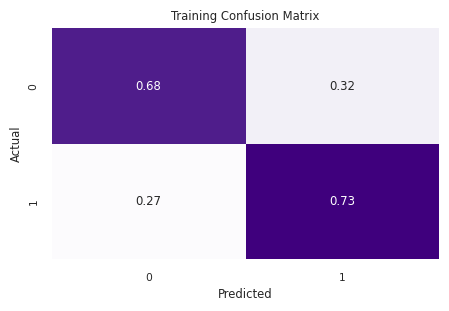

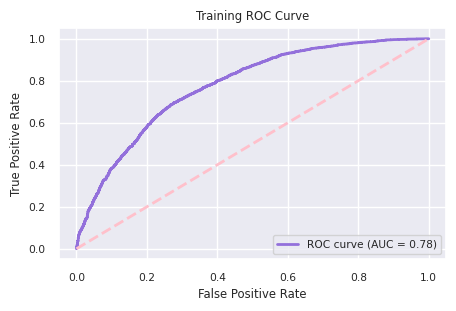

Classification Report for Model:
Training Classification Report:
               precision    recall  f1-score   support

         0.0       0.72      0.68      0.70      2834
         1.0       0.69      0.73      0.71      2723

    accuracy                           0.71      5557
   macro avg       0.71      0.71      0.71      5557
weighted avg       0.71      0.71      0.71      5557

AUC Scores
Training AUC Score: 0.78
Validation Accuracy: 68.53%


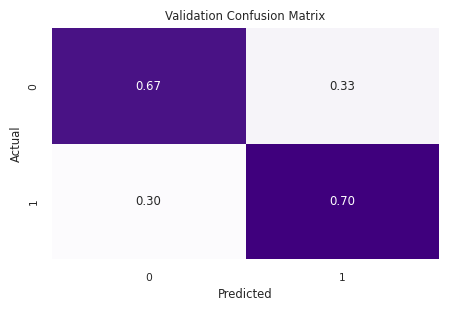

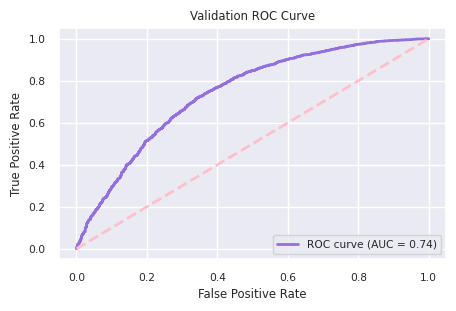

Classification Report for Model:
Validation Classification Report:
               precision    recall  f1-score   support

         0.0       0.68      0.67      0.67      1797
         1.0       0.69      0.70      0.70      1908

    accuracy                           0.69      3705
   macro avg       0.68      0.68      0.68      3705
weighted avg       0.69      0.69      0.69      3705

AUC Scores
Validation AUC Score: 0.74


In [105]:
# @title Random Forrest Model
# parameter grid
param_grid2 = {
    'n_estimators': [5, 10, 15, 20, 25, 50, 100, 150],
    'max_depth': [None, 5, 10, 15, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'bootstrap': [True, False],
    'criterion': ['gini', 'entropy']
}

model_2 = RandomForestClassifier(random_state=42, n_jobs=-1)

# GridSearchCV
grid_search2 = GridSearchCV(estimator=model_2, param_grid=param_grid2, cv=13, scoring='accuracy', n_jobs=-1)
grid_search2.fit(X_train, y_train)

# best params
print("=" * 62)
print("Best Hyperparameters:")
print(grid_search.best_params_)
print("=" * 62)

# Use best estim.
best_model2 = grid_search2.best_estimator_

# Dscores - cross-val
cv_scores2 = cross_val_score(best_model2, X_train, y_train, cv=13, scoring='accuracy')
print(f"Cross-Validation Scores: {cv_scores2}")
print(f"Mean Cross-Validation Score: {cv_scores2.mean():.2f}")
print(f"Standard Deviation of Cross-Validation Score: {cv_scores2.std():.2f}")
print("=" * 62)

# Evaluate plot training data
predict_and_plot(best_model2, X_train, y_train, 'Training')

# Evaluate plot test data
predict_and_plot(best_model2, X_test, y_test, 'Validation')

Best Hyperparameters:
{'algorithm': 'kd_tree', 'n_neighbors': 17, 'weights': 'distance'}
Cross-Validation Scores: [0.66366906 0.68794964 0.66156616 0.64086409 0.65346535]
Mean Cross-Validation Score: 0.66
Standard Deviation of Cross-Validation Score: 0.02
Training Accuracy: 0.6858016915601943
Validation Accuracy: 0.6666666666666666
Training Accuracy: 68.58%


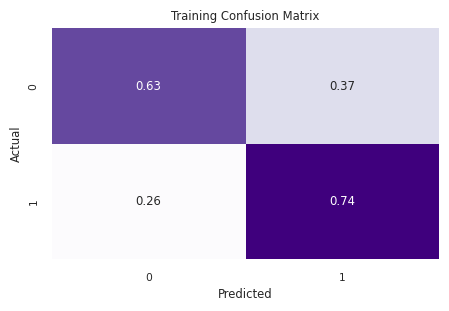

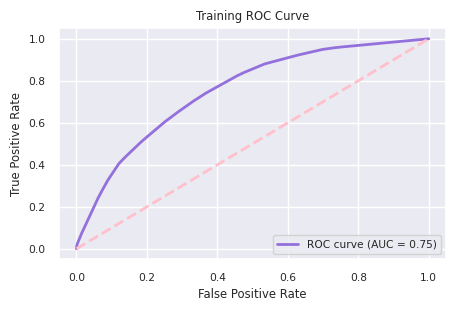

Classification Report for Model:
Training Classification Report:
               precision    recall  f1-score   support

         0.0       0.72      0.63      0.67      2834
         1.0       0.66      0.74      0.70      2723

    accuracy                           0.69      5557
   macro avg       0.69      0.69      0.69      5557
weighted avg       0.69      0.69      0.69      5557

AUC Scores
Training AUC Score: 0.75
Validation Accuracy: 66.67%


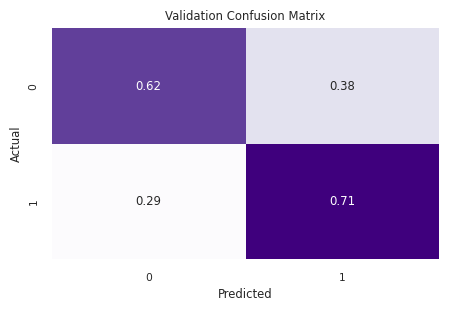

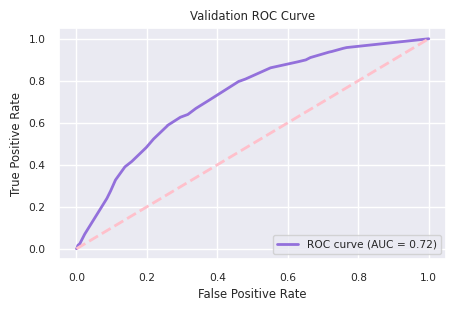

Classification Report for Model:
Validation Classification Report:
               precision    recall  f1-score   support

         0.0       0.67      0.62      0.65      1797
         1.0       0.67      0.71      0.69      1908

    accuracy                           0.67      3705
   macro avg       0.67      0.67      0.67      3705
weighted avg       0.67      0.67      0.67      3705

AUC Scores
Validation AUC Score: 0.72


In [106]:
#  @title Decision Tree Models

# param grid
param_grid3 = {
    'max_depth': [None, 5, 10, 15, 20],
    'min_samples_split': [2, 5, 10, 15, 20, 25],
    'min_samples_leaf': [1, 3, 5, 7],
    'criterion': ['gini', 'entropy']
}

decision_tree_model = DecisionTreeClassifier(random_state=42)

# GridSearchCV
grid_search3 = GridSearchCV(estimator=decision_tree_model, param_grid=param_grid3, cv=5, n_jobs=-1, scoring='accuracy')
grid_search3.fit(X_train, y_train)

# best hyperparameters
print("=" * 62)
print("Best Hyperparameters:")
print(grid_search.best_params_)
print("=" * 62)
best_model3 = grid_search3.best_estimator_

# cross-validation scores
cv_scores3 = cross_val_score(best_model3, X_train, y_train, cv=5, scoring='accuracy')
print(f"Cross-Validation Scores: {cv_scores3}")
print(f"Mean Cross-Validation Score: {cv_scores3.mean():.2f}")
print(f"Standard Deviation of Cross-Validation Score: {cv_scores3.std():.2f}")
print("=" * 62)

# Fit best model
best_model3.fit(X_train, y_train)

# training and validation accuracy
train_accuracy = best_model3.score(X_train, y_train)
val_accuracy = best_model3.score(X_test, y_test)
print("=" * 62)
print("Training Accuracy:", train_accuracy)
print("Validation Accuracy:", val_accuracy)
print("=" * 62)
# plot training data
predict_and_plot(best_model3, X_train, y_train, 'Training')

# plot val data
predict_and_plot(best_model3, X_test, y_test, 'Validation')

Best Hyperparameters: {'C': 1, 'gamma': 'scale', 'kernel': 'linear'}
Cross-Validation Scores: [0.70327103 0.66588785 0.70093458 0.68224299 0.73598131 0.67056075
 0.69789227 0.70257611 0.68149883 0.66042155 0.67213115 0.68852459
 0.66276347]
Mean Cross-Validation Score: 0.69
Standard Deviation of Cross-Validation Score: 0.02
Training Accuracy: 68.65%


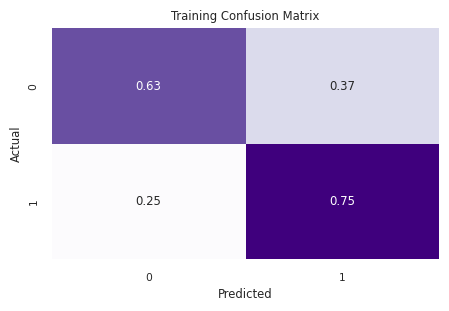

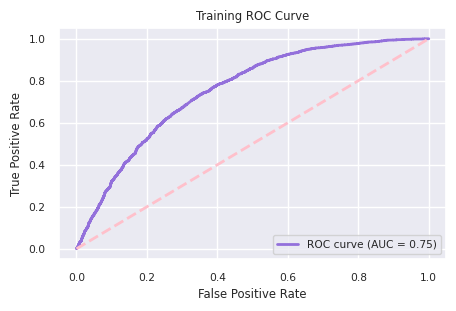

Classification Report for Model:
Training Classification Report:
               precision    recall  f1-score   support

         0.0       0.72      0.63      0.67      2834
         1.0       0.66      0.75      0.70      2723

    accuracy                           0.69      5557
   macro avg       0.69      0.69      0.69      5557
weighted avg       0.69      0.69      0.69      5557

AUC Scores
Training AUC Score: 0.75
Validation Accuracy: 69.82%


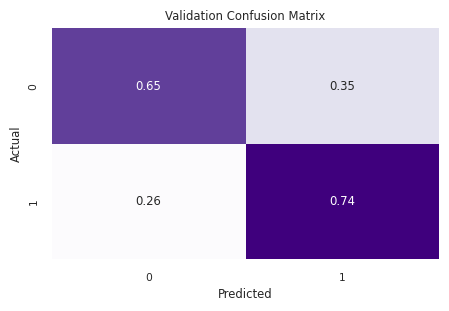

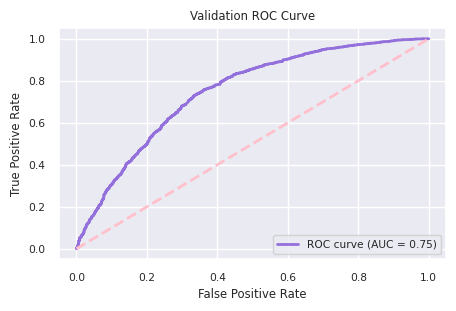

Classification Report for Model:
Validation Classification Report:
               precision    recall  f1-score   support

         0.0       0.71      0.65      0.68      1797
         1.0       0.69      0.74      0.72      1908

    accuracy                           0.70      3705
   macro avg       0.70      0.70      0.70      3705
weighted avg       0.70      0.70      0.70      3705

AUC Scores
Validation AUC Score: 0.75


In [116]:
#  @title SVR model

# setup
svm_model = SVC(kernel='linear', probability=True, class_weight='balanced')  # prob for ROC

# params
param_grid4 = {
    'C': [1, 10],  # Regs
    'kernel': ['linear'],     # Kernel
    'gamma': ['scale', 'auto']  # coeff-K
}

# GridSearchCV
grid_search4 = GridSearchCV(svm_model, param_grid4, cv=5, scoring='accuracy')
grid_search4.fit(X_train, y_train)

# best model
best_model4 = grid_search4.best_estimator_
best_params4 = grid_search4.best_params_

# best
print("=" * 62)
print("Best Hyperparameters:", best_params4)
print("=" * 62)

# cross-vals
cv_scores = cross_val_score(best_model4, X_train, y_train, cv=13, scoring='accuracy')
print(f"Cross-Validation Scores: {cv_scores}")
print(f"Mean Cross-Validation Score: {cv_scores.mean():.2f}")
print(f"Standard Deviation of Cross-Validation Score: {cv_scores.std():.2f}")
print("=" * 62)

best_model4.fit(X_train, y_train)
predict_and_plot(best_model4, X_train, y_train, name='Training')
predict_and_plot(best_model4, X_test, y_test, name='Validation')
print("=" * 62)

Best Hyperparameters: {'var_smoothing': 1e-06}
Best Cross-Validation Score (Accuracy): 0.6550251248146397
Naive Bayes Training Accuracy: 65.47%


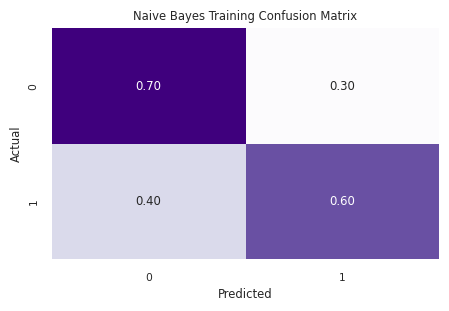

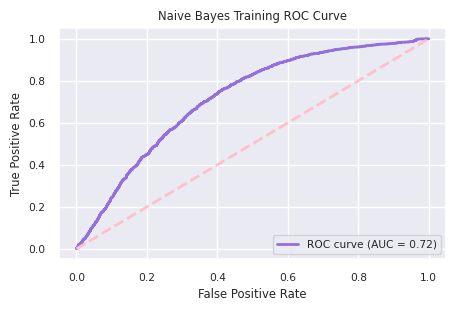

Classification Report for Model:
Naive Bayes Training Classification Report:
               precision    recall  f1-score   support

         0.0       0.65      0.70      0.68      2834
         1.0       0.66      0.60      0.63      2723

    accuracy                           0.65      5557
   macro avg       0.66      0.65      0.65      5557
weighted avg       0.66      0.65      0.65      5557

AUC Scores
Naive Bayes Training AUC Score: 0.72
Naive Bayes Validation Accuracy: 64.89%


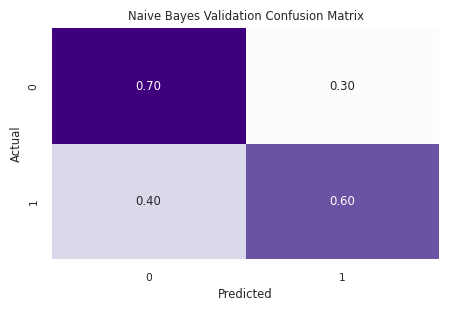

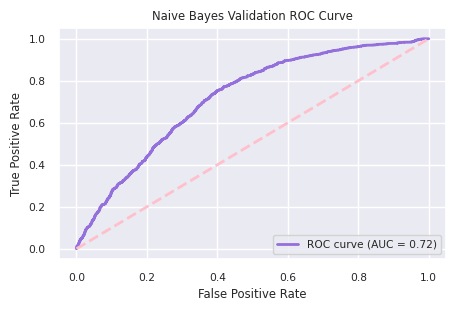

Classification Report for Model:
Naive Bayes Validation Classification Report:
               precision    recall  f1-score   support

         0.0       0.62      0.70      0.66      1797
         1.0       0.68      0.60      0.64      1908

    accuracy                           0.65      3705
   macro avg       0.65      0.65      0.65      3705
weighted avg       0.65      0.65      0.65      3705

AUC Scores
Naive Bayes Validation AUC Score: 0.72


In [109]:
#  @title Naive Bayes Model

nb_model = GaussianNB()

# params
param_grid5 = {
    'var_smoothing': [1e-9, 1e-8, 1e-7, 1e-6, 1e-5, 1e-4, 1e-3]
}

# GridSearchCV
grid_search5 = GridSearchCV(nb_model, param_grid5, cv=5, n_jobs=-1, scoring='accuracy')
grid_search5.fit(X_train, y_train)

# get the best
best_model5 = grid_search5.best_estimator_
best_params5 = grid_search5.best_params_

# Print it out
print("=" * 62)
print("Best Hyperparameters:", best_params5)
print("Best Cross-Validation Score (Accuracy):", grid_search5.best_score_)
print("=" * 62)

best_model5.fit(X_train, y_train)
predict_and_plot(best_model5, X_train, y_train, name='Naive Bayes Training')
predict_and_plot(best_model5, X_test, y_test, name='Naive Bayes Validation')

Best Hyperparameters: {'learning_rate': 1, 'n_estimators': 25}
Best Cross-Validation Score (Accuracy): 0.6899356662284933
AdaBoost Training Accuracy: 68.99%


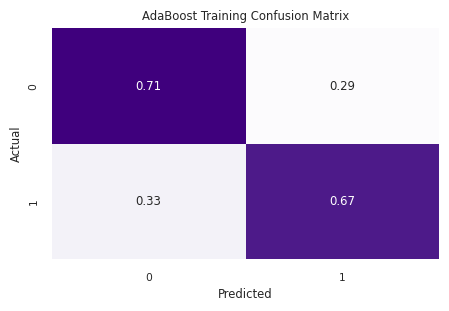

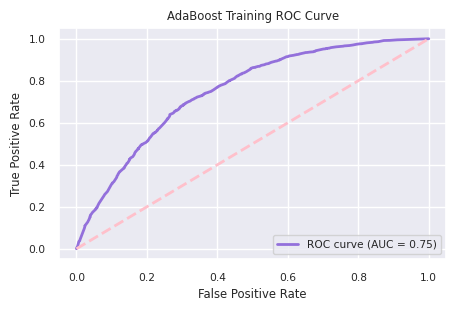

Classification Report for Model:
AdaBoost Training Classification Report:
               precision    recall  f1-score   support

         0.0       0.69      0.71      0.70      2834
         1.0       0.69      0.67      0.68      2723

    accuracy                           0.69      5557
   macro avg       0.69      0.69      0.69      5557
weighted avg       0.69      0.69      0.69      5557

AUC Scores
AdaBoost Training AUC Score: 0.75
AdaBoost Validation Accuracy: 67.85%


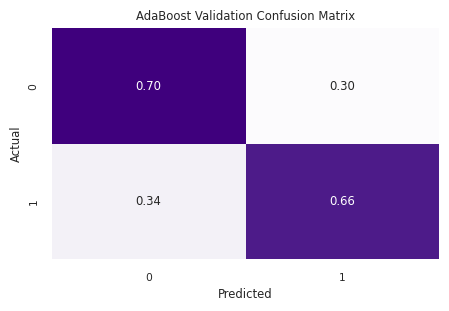

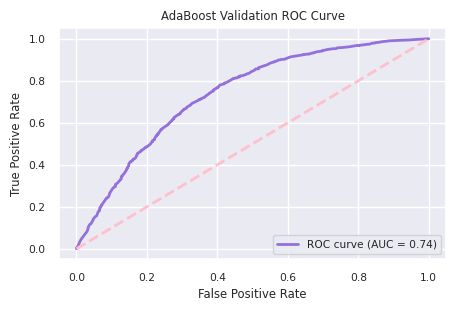

Classification Report for Model:
AdaBoost Validation Classification Report:
               precision    recall  f1-score   support

         0.0       0.66      0.70      0.68      1797
         1.0       0.70      0.66      0.68      1908

    accuracy                           0.68      3705
   macro avg       0.68      0.68      0.68      3705
weighted avg       0.68      0.68      0.68      3705

AUC Scores
AdaBoost Validation AUC Score: 0.74


In [110]:
#  @title AdaBoost Model

# There are issues with AdaBoost and not using SAMME due to deprectation, so need to set it as SAMME algorithm explicitly
adaboost_model = AdaBoostClassifier(algorithm='SAMME', random_state=42)

# params
param_grid6 = {
    'n_estimators': [5, 10, 15, 20, 25, 50, 100, 150],
    'learning_rate': [0.01, 0.1, 1]
}

# GridSearchCV
grid_search6 = GridSearchCV(adaboost_model, param_grid6, cv=5, n_jobs=-1, scoring='accuracy')
grid_search6.fit(X_train, y_train)

best_model6 = grid_search6.best_estimator_
best_params6 = grid_search6.best_params_

# Print best options
print("=" * 62)
print("Best Hyperparameters:", best_params6)
print("Best Cross-Validation Score (Accuracy):", grid_search6.best_score_)

best_model6.fit(X_train, y_train)
predict_and_plot(best_model6, X_train, y_train, name='AdaBoost Training')
predict_and_plot(best_model6, X_test, y_test, name='AdaBoost Validation')

Best Hyperparameters: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 15}
Best Cross-Validation Score (Accuracy): 0.6865150004209054
GBM Training Accuracy: 70.40%


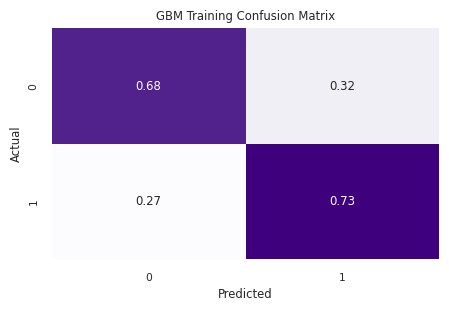

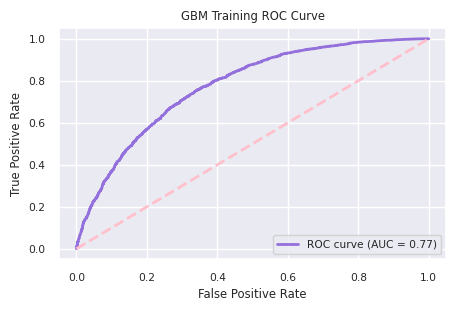

Classification Report for Model:
GBM Training Classification Report:
               precision    recall  f1-score   support

         0.0       0.72      0.68      0.70      2834
         1.0       0.69      0.73      0.71      2723

    accuracy                           0.70      5557
   macro avg       0.70      0.70      0.70      5557
weighted avg       0.71      0.70      0.70      5557

AUC Scores
GBM Training AUC Score: 0.77
GBM Validation Accuracy: 68.23%


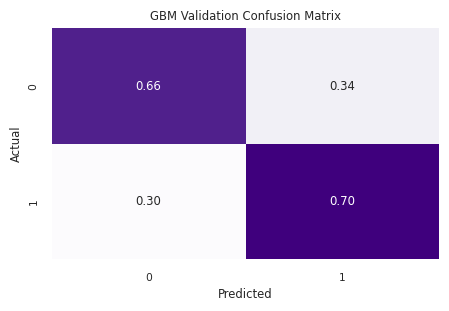

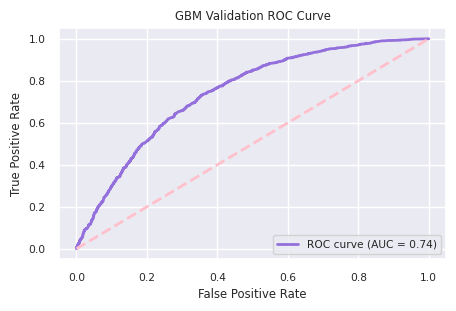

Classification Report for Model:
GBM Validation Classification Report:
               precision    recall  f1-score   support

         0.0       0.68      0.66      0.67      1797
         1.0       0.69      0.70      0.69      1908

    accuracy                           0.68      3705
   macro avg       0.68      0.68      0.68      3705
weighted avg       0.68      0.68      0.68      3705

AUC Scores
GBM Validation AUC Score: 0.74


In [111]:
#  @title Gradient Boost

gbm_model = GradientBoostingClassifier(n_estimators=100, max_depth=3, random_state=42)

# params
param_grid7 = {
    'n_estimators': [5, 10, 15, 20, 25, 50, 100, 150],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.2],
}

# GridSearchCV
grid_search7 = GridSearchCV(gbm_model, param_grid7, cv=5, n_jobs=-1, scoring='accuracy')
grid_search7.fit(X_train, y_train)

# best models
best_model7 = grid_search7.best_estimator_
best_params7 = grid_search7.best_params_

# Print the best
print("=" * 62)
print("Best Hyperparameters:", best_params7)
print("Best Cross-Validation Score (Accuracy):", grid_search7.best_score_)

# Train
best_model7.fit(X_train, y_train)
predict_and_plot(best_model7, X_train, y_train, name='GBM Training')
predict_and_plot(best_model7, X_test, y_test, name='GBM Validation')
print("=" * 62)

Best Hyperparameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50}
Best Cross-Validation Score (Accuracy): 0.6886745688957385
XGBoost Training Accuracy: 70.45%


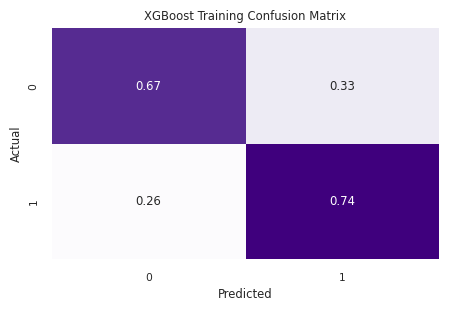

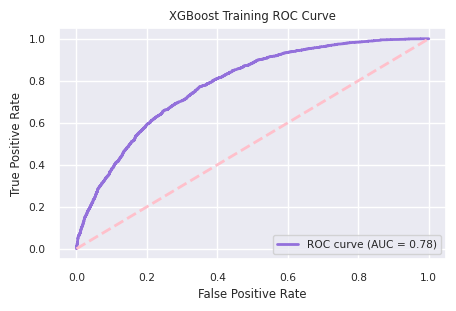

Classification Report for Model:
XGBoost Training Classification Report:
               precision    recall  f1-score   support

         0.0       0.73      0.67      0.70      2834
         1.0       0.68      0.74      0.71      2723

    accuracy                           0.70      5557
   macro avg       0.71      0.71      0.70      5557
weighted avg       0.71      0.70      0.70      5557

AUC Scores
XGBoost Training AUC Score: 0.78
XGBoost Validation Accuracy: 68.61%


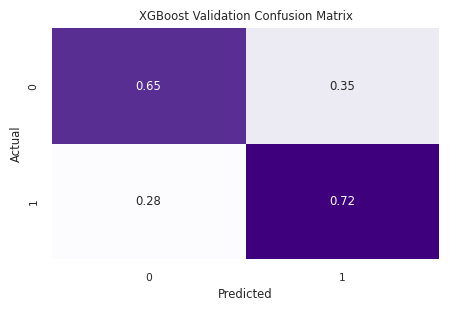

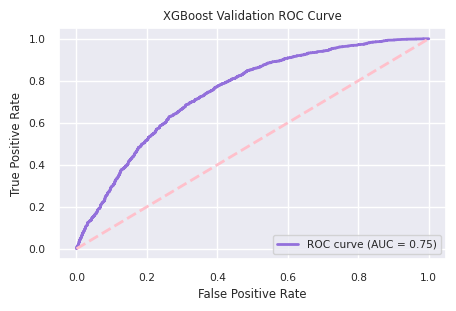

Classification Report for Model:
XGBoost Validation Classification Report:
               precision    recall  f1-score   support

         0.0       0.68      0.65      0.67      1797
         1.0       0.69      0.72      0.70      1908

    accuracy                           0.69      3705
   macro avg       0.69      0.69      0.69      3705
weighted avg       0.69      0.69      0.69      3705

AUC Scores
XGBoost Validation AUC Score: 0.75


In [112]:
#  @title XGBoost Model

xgboost_model = XGBClassifier(n_estimators=100, max_depth=3, random_state=42)

# params
param_grid8 = {
    'n_estimators': [5, 10, 15, 20, 25, 50, 100, 150],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.2],
}

# GridSearchCV
grid_search8 = GridSearchCV(xgboost_model, param_grid8, cv=5, n_jobs=-1, scoring='accuracy')
grid_search8.fit(X_train, y_train)

# best mods
best_model8 = grid_search8.best_estimator_
best_params8 = grid_search8.best_params_

# Print the best!
print("=" * 62)
print("Best Hyperparameters:", best_params8)
print("Best Cross-Validation Score (Accuracy):", grid_search8.best_score_)

best_model8.fit(X_train, y_train)
predict_and_plot(best_model8, X_train, y_train, name='XGBoost Training')
predict_and_plot(best_model8, X_test, y_test, name='XGBoost Validation')

Best Hyperparameters: {'reg_param': 0.5, 'store_covariance': True}
Best Cross-Validation Score (Accuracy): 0.663845035582695
QDA Training Accuracy: 66.73%


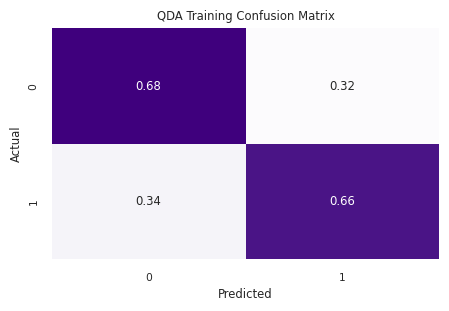

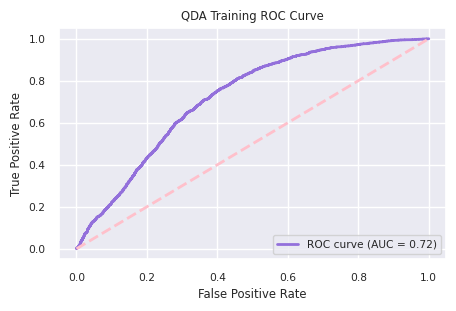

Classification Report for Model:
QDA Training Classification Report:
               precision    recall  f1-score   support

         0.0       0.67      0.68      0.68      2834
         1.0       0.66      0.66      0.66      2723

    accuracy                           0.67      5557
   macro avg       0.67      0.67      0.67      5557
weighted avg       0.67      0.67      0.67      5557

AUC Scores
QDA Training AUC Score: 0.72
QDA Validation Accuracy: 66.91%


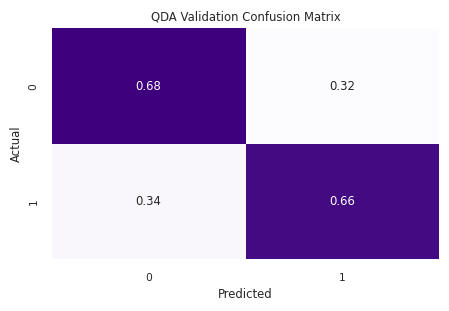

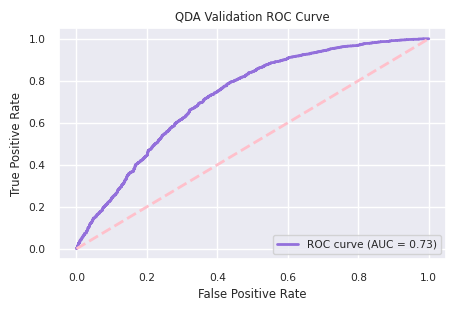

Classification Report for Model:
QDA Validation Classification Report:
               precision    recall  f1-score   support

         0.0       0.65      0.68      0.66      1797
         1.0       0.68      0.66      0.67      1908

    accuracy                           0.67      3705
   macro avg       0.67      0.67      0.67      3705
weighted avg       0.67      0.67      0.67      3705

AUC Scores
QDA Validation AUC Score: 0.73


In [113]:
# @title QDA Model

qda_model = QuadraticDiscriminantAnalysis()

# params
param_grid9 = {
    'reg_param': [0.0, 0.1, 0.5, 1.0],  # Regs
    'store_covariance': [True, False]    # if to store the covariance matrix
}

# GridSearchCV
grid_search9 = GridSearchCV(qda_model, param_grid9, cv=5, n_jobs=-1, scoring='accuracy')
grid_search9.fit(X_train, y_train)

# get the best!
best_model9 = grid_search9.best_estimator_
best_params9 = grid_search9.best_params_

# Print the best!
print("=" * 62)
print("Best Hyperparameters:", best_params9)
print("Best Cross-Validation Score (Accuracy):", grid_search9.best_score_)
print("=" * 62)

best_model9.fit(X_train, y_train)
predict_and_plot(best_model9, X_train, y_train, name='QDA Training')
predict_and_plot(best_model9, X_test, y_test, name='QDA Validation')

Best Hyperparameters: {'solver': 'svd'}
Best Cross-Validation Score (Accuracy): 0.6870591015936125
LDA Training Accuracy: 68.83%


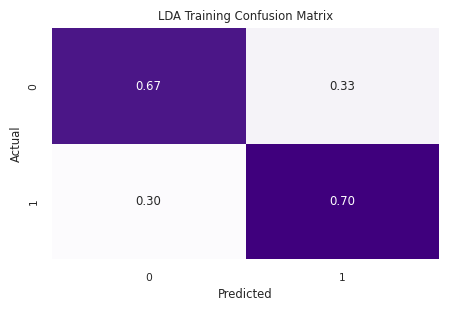

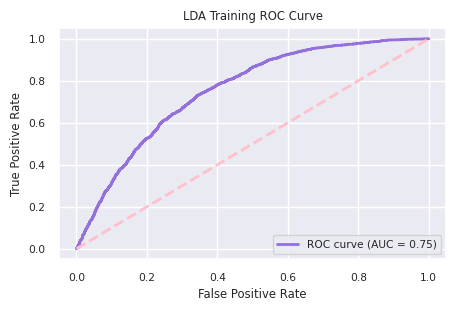

Classification Report for Model:
LDA Training Classification Report:
               precision    recall  f1-score   support

         0.0       0.70      0.67      0.69      2834
         1.0       0.67      0.70      0.69      2723

    accuracy                           0.69      5557
   macro avg       0.69      0.69      0.69      5557
weighted avg       0.69      0.69      0.69      5557

AUC Scores
LDA Training AUC Score: 0.75
LDA Validation Accuracy: 69.07%


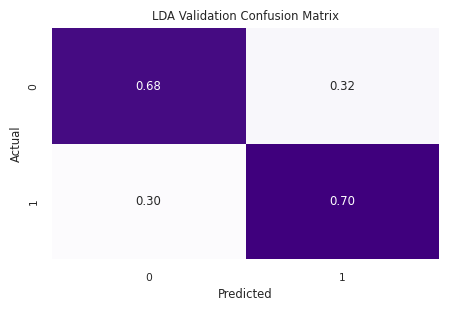

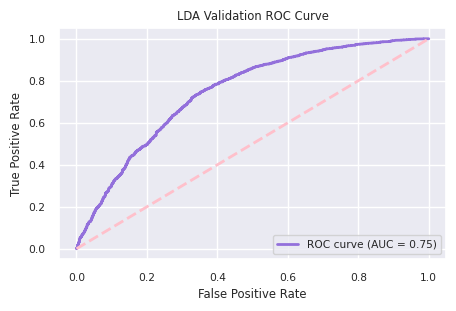

Classification Report for Model:
LDA Validation Classification Report:
               precision    recall  f1-score   support

         0.0       0.68      0.68      0.68      1797
         1.0       0.70      0.70      0.70      1908

    accuracy                           0.69      3705
   macro avg       0.69      0.69      0.69      3705
weighted avg       0.69      0.69      0.69      3705

AUC Scores
LDA Validation AUC Score: 0.75


In [114]:
# @title LDA Model

lda_model = LinearDiscriminantAnalysis()

# params
param_grid10 = [
    {'solver': ['svd']},  # 'svd' does not support shrinkage
    {'solver': ['lsqr', 'eigen'], 'shrinkage': [None, 0.1, 0.5, 1.0]}  # Only for 'lsqr' and 'eigen'
]

# GridSearchCV
grid_search10 = GridSearchCV(lda_model, param_grid10, cv=5, n_jobs=-1, scoring='accuracy')
grid_search10.fit(X_train, y_train)

# Get the best
best_model10 = grid_search10.best_estimator_
best_params10 = grid_search10.best_params_

# Print the best
print("=" * 62)
print("Best Hyperparameters:", best_params10)
print("Best Cross-Validation Score (Accuracy):", grid_search10.best_score_)
print("=" * 62)

best_model10.fit(X_train, y_train)
predict_and_plot(best_model10, X_train, y_train, name='LDA Training')
predict_and_plot(best_model10, X_test, y_test, name='LDA Validation')

All in all, it was not great.  

In [62]:
# @title New sample for analysis
df_n = sample_df[['Diabetes_012', 'GenHlth', 'HighBP', 'HighChol', 'DiffWalk']].copy()
df_target = df_n['Diabetes_012']  # Target column
df_features = df_n.drop(columns=['Diabetes_012'])  # features
X = df_features
y = df_target

In [63]:
# Split the training set - 80% Train, 20% Test/Validation (so 80/10/10)
# Split off the test and training set
x_train, x_test, y_train, y_test = train_test_split(X, y,
                                                    test_size=0.1,
                                                    shuffle=True)

# Split off to get the validation sets
x_train, x_val, y_train, y_val = train_test_split(x_train, y_train,
                                                  test_size=1 / 9)
print("Test, train and validation sets created")

print("The shape of the data are:")
# Check the shapes are actually correct:
print("X_train shape: {}".format(x_train.shape))
print("y_train shape: {}".format(y_train.shape))

print("X_test shape: {}".format(x_test.shape))
print("y_test shape: {}".format(y_test.shape))

print("X_val shape: {}".format(x_val.shape))
print("y val shape: {}".format(y_val.shape))
print("------------------")

print("Converting to tensorflow")
x_train = tf.convert_to_tensor(x_train)
x_test = tf.convert_to_tensor(x_test)
y_train = tf.convert_to_tensor(y_train)
y_test = tf.convert_to_tensor(y_test)
x_val = tf.convert_to_tensor(x_val)
y_val = tf.convert_to_tensor(y_val)

print("Converted to tensorflow")
print("------------------")
print("The shape of the data are:")

print("X_train shape: {}".format(x_train.shape))
print("y_train shape: {}".format(y_train.shape))

print("X_test shape: {}".format(x_test.shape))
print("y_test shape: {}".format(y_test.shape))

print("X_val shape: {}".format(x_val.shape))
print("y val shape: {}".format(y_val.shape))
print("------------------")
print("The data has been preprocessed")

Test, train and validation sets created
The shape of the data are:
X_train shape: (7408, 4)
y_train shape: (7408,)
X_test shape: (927, 4)
y_test shape: (927,)
X_val shape: (927, 4)
y val shape: (927,)
------------------
Converting to tensorflow
Converted to tensorflow
------------------
The shape of the data are:
X_train shape: (7408, 4)
y_train shape: (7408,)
X_test shape: (927, 4)
y_test shape: (927,)
X_val shape: (927, 4)
y val shape: (927,)
------------------
The data has been preprocessed


In [64]:
# Create model
network = models.Sequential([
                            layers.Input(shape=(4,)),
                            layers.Dense(8, activation='relu'),
                            layers.Dense(12, activation="relu"),
                            layers.Dense(16, activation="relu"),
                            layers.Dense(2, activation='softmax')]
                            )
# Plot the model and display the image

SAMPLE_WEIGHT_MODE = 0.001

plot_model(model=network,
           to_file='model.png',
           show_shapes=True,
           show_layer_names=True,
           rankdir='LR',
           expand_nested=True)
# Print the summary of the network
network.summary()
# Compile the model
network.compile(optimizer="rmsprop",
                loss="sparse_categorical_crossentropy",
                metrics=["accuracy"])

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense (Dense)                        │ (None, 8)                   │              40 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 12)                  │             108 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 16)                  │             208 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 2)                   │              34 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 390 (1.52 KB)

 Trainable params: 390 (1.52 KB)

 Non-trainable params: 0 (0.00 B)

In [65]:
# Fit the model now
init_weights = network.get_weights()

history = network.fit(x_train,
                      y_train,
                      epochs=100,
                      batch_size=128,
                      validation_data=(x_val, y_val),
                      verbose=0,
                      )

------------------
Model accuracy
------------------


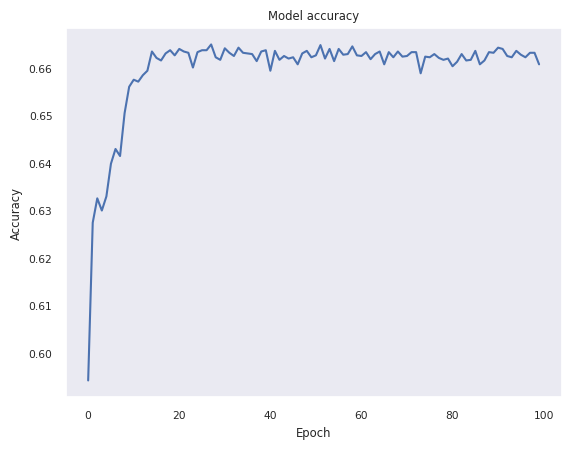

------------------
Training and Validation accuracy
------------------


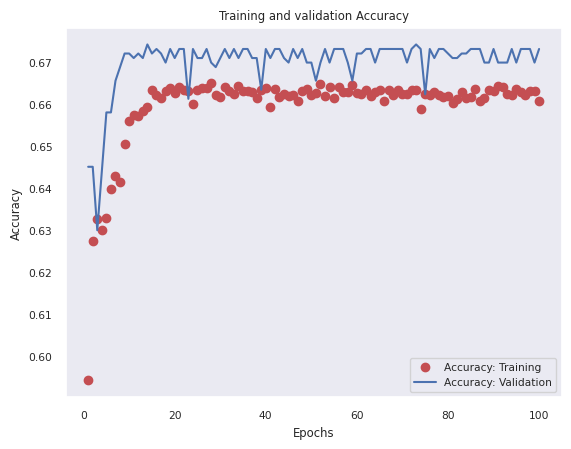

In [66]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(acc) + 1)

# Plot training accuracy values
print("------------------")
print("Model accuracy")
print("------------------")

plt.plot(history.history['accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.grid()
plt.show()

print("------------------")
print("Training and Validation accuracy")
print("------------------")
plt.plot(epochs, acc, 'ro', label='Accuracy: Training')
plt.plot(epochs, val_acc, 'b', label='Accuracy: Validation')
plt.title('Training and validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.grid()
plt.legend()
plt.show()

------------------
Model loss
------------------


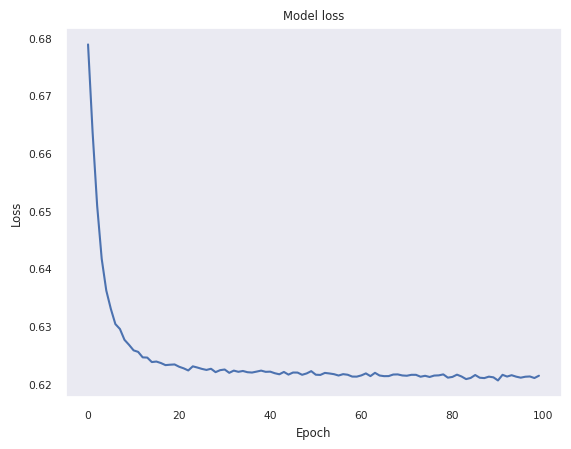

------------------
Training and Validation loss
------------------


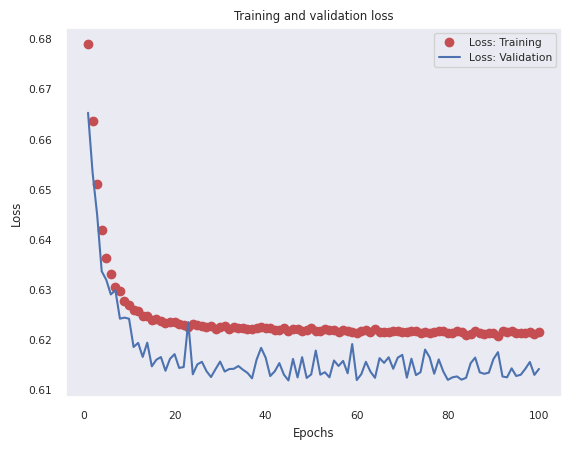

In [67]:
# Plot training loss values
print("------------------")
print("Model loss")
print("------------------")
plt.plot(history.history['loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.grid()
plt.show()

print("------------------")
print("Training and Validation loss")
print("------------------")
plt.plot(epochs, loss, 'ro', label='Loss: Training')
plt.plot(epochs, val_loss, 'b', label='Loss: Validation')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.grid()
plt.legend()
plt.show()

In [68]:
# print results
print("------------------")
print("RESULTS")
test_loss, test_acc = network.evaluate(x_test, y_test)
print(f'test_loss: {test_loss}')
print(f'test_acc: {test_acc}')
print("------------------")
results = network.evaluate(x_test, y_test)
results
print("------------------")

------------------
RESULTS
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6714 - loss: 0.6155   
test_loss: 0.617975115776062
test_acc: 0.6655879020690918
------------------
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6714 - loss: 0.6155 
------------------


In [69]:
# Set up for logging
ROOT_LOGDIR = "logs"
run_id = datetime.now().strftime("%Y%m%d-%H%M%S")
logdir = os.path.join(ROOT_LOGDIR, run_id)

!rm -rf ./logs/
file_writer = tf.summary.create_file_writer(logdir)

# Set up the callbacks
callbacks = [
    tf.keras.callbacks.TensorBoard(
        log_dir=logdir,
        histogram_freq=1
    )
]

# Set up the model; to run
network.set_weights(init_weights)
init_weights = network.get_weights()
history = network.fit(x_train,
                      y_train,
                      epochs=100,
                      batch_size=128,
                      callbacks=callbacks,
                      validation_data=(x_val, y_val),
                      verbose=0,
                      )

In [70]:
# boot into the tensorboard and display
%load_ext tensorboard
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

In [71]:
# Add in a dropout layer after each layer
network_drop = models.Sequential([layers.Input(shape=(4,)),
                                  layers.Dense(8, activation='relu'),
                                  layers.Dropout(0.05),
                                  layers.Dense(12, activation="relu"),
                                  layers.Dropout(0.05),
                                  layers.Dense(16, activation="relu"),
                                  layers.Dropout(0.05),
                                  layers.Dense(2, activation='softmax')])
# sample_weight_mode = 0.001
network_drop.compile(optimizer="rmsprop",
                     loss="sparse_categorical_crossentropy",
                     metrics=["accuracy"])

init_weights = network_drop.get_weights()
history_drop = network_drop.fit(x_train,
                                y_train,
                                epochs=100,
                                batch_size=256,
                                validation_data=(x_val, y_val),
                                verbose=0,
                                )

------------------
Model accuracy
------------------


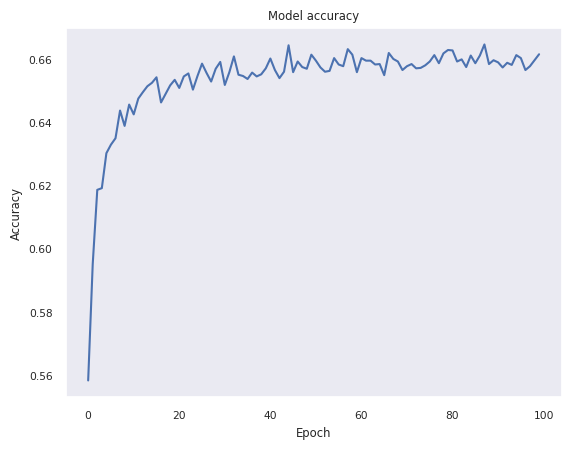

------------------
Training and Validation accuracy'
------------------


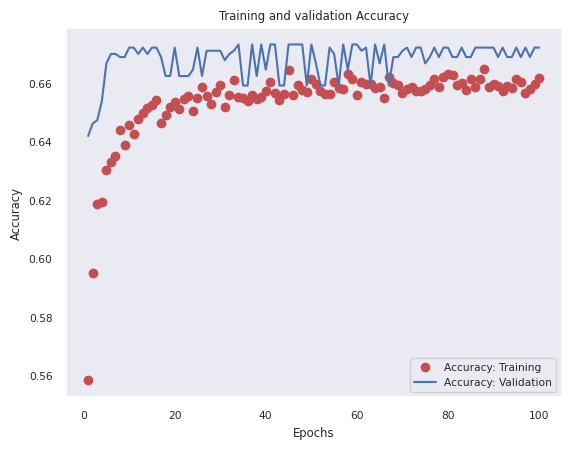

In [72]:
acc = history_drop.history['accuracy']
val_acc = history_drop.history['val_accuracy']
loss = history_drop.history['loss']
val_loss = history_drop.history['val_loss']
epochs = range(1, len(acc) + 1)

# Plot training accuracy values
print("------------------")
print("Model accuracy")
print("------------------")

plt.plot(history_drop.history['accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.grid()
plt.show()

print("------------------")
print("Training and Validation accuracy'")
print("------------------")
plt.plot(epochs, acc, 'ro', label='Accuracy: Training')
plt.plot(epochs, val_acc, 'b', label='Accuracy: Validation')
plt.title('Training and validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.grid()
plt.legend()
plt.show()

------------------
Model loss
------------------


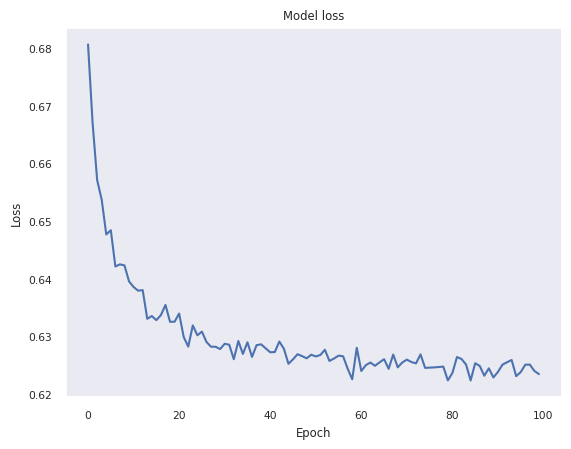

------------------
Training and Validation loss
------------------


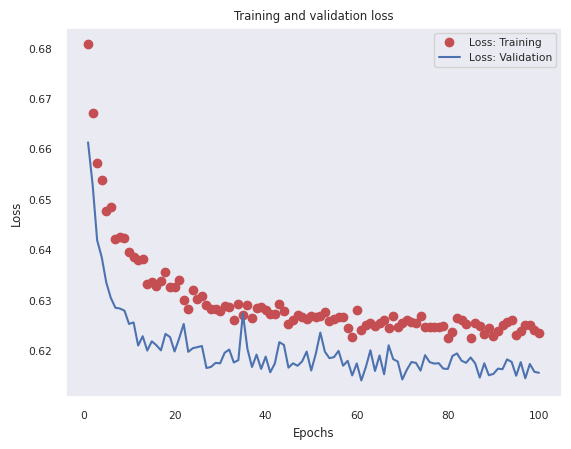

In [73]:
# Plot training loss values
print("------------------")
print("Model loss")
print("------------------")
plt.plot(history_drop.history['loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.grid()
plt.show()

print("------------------")
print("Training and Validation loss")
print("------------------")
plt.plot(epochs, loss, 'ro', label='Loss: Training')
plt.plot(epochs, val_loss, 'b', label='Loss: Validation')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.grid()
plt.legend()
plt.show()

In [74]:
# plot results
print("------------------")
print("RESULTS")
rmsprop_test_loss, rmsprop_test_acc = network_drop.evaluate(x_test, y_test)
print(f'test_loss: {rmsprop_test_loss}')
print(f'test_acc: {rmsprop_test_acc}')
print("------------------")
rmsprop_results = network_drop.evaluate(x_test, y_test)
rmsprop_results
print("------------------")

------------------
RESULTS
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6643 - loss: 0.6167
test_loss: 0.6176626682281494
test_acc: 0.6655879020690918
------------------
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6643 - loss: 0.6167 
------------------


In [75]:
# Add in a dropout layer after each layer
network_drop1 = models.Sequential([layers.Input(shape=(4,)),
                                  layers.Dense(8, activation='relu'),
                                  layers.Dropout(0.05),
                                  layers.Dense(12, activation="relu"),
                                  layers.Dropout(0.05),
                                  layers.Dense(16, activation="relu"),
                                  layers.Dropout(0.05),
                                  layers.Dense(2, activation='softmax')]
                                  )
# sample_weight_mode = 0.001
network_drop1.compile(optimizer="adam",
                      loss="sparse_categorical_crossentropy",
                      metrics=["accuracy"])

init_weights = network_drop1.get_weights()
history_drop1 = network_drop1.fit(x_train,
                                  y_train,
                                  epochs=100,
                                  batch_size=256,
                                  validation_data=(x_val, y_val),
                                  verbose=0,
                                  )

------------------
Model accuracy
------------------


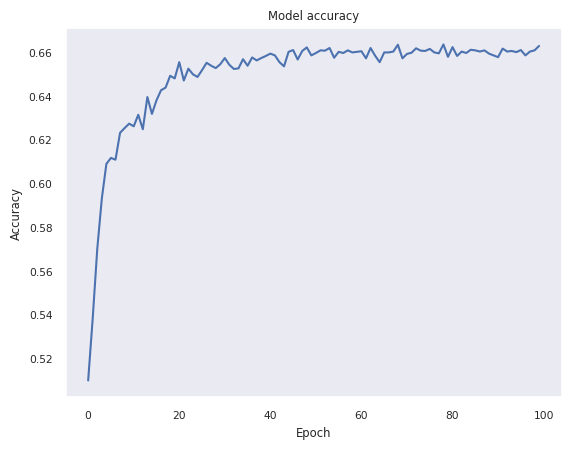

------------------
Training and Validation accuracy'
------------------


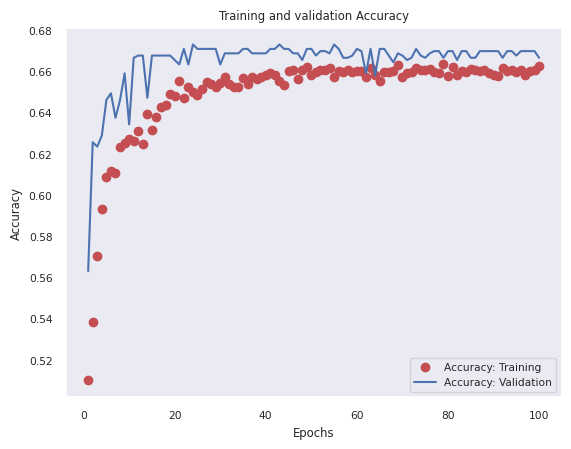

In [76]:
acc = history_drop1.history['accuracy']
val_acc = history_drop1.history['val_accuracy']
loss = history_drop1.history['loss']
val_loss = history_drop1.history['val_loss']
epochs = range(1, len(acc) + 1)

# Plot training accuracy values
print("------------------")
print("Model accuracy")
print("------------------")

plt.plot(history_drop1.history['accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.grid()
plt.show()

print("------------------")
print("Training and Validation accuracy'")
print("------------------")
plt.plot(epochs, acc, 'ro', label='Accuracy: Training')
plt.plot(epochs, val_acc, 'b', label='Accuracy: Validation')
plt.title('Training and validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.grid()
plt.legend()
plt.show()

------------------
Model loss
------------------


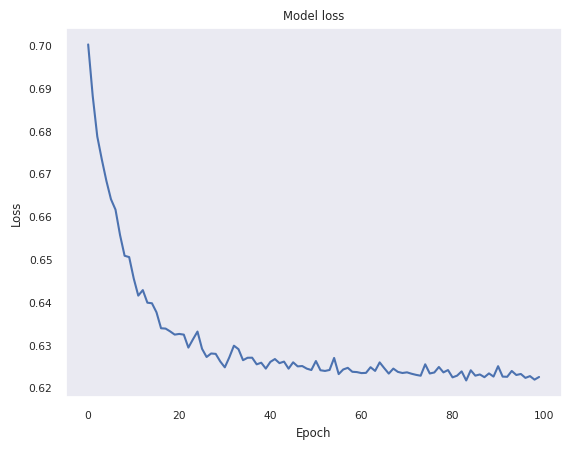

------------------
Training and Validation loss
------------------


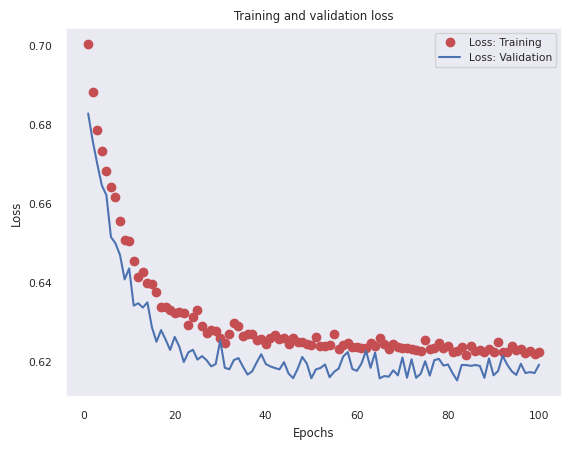

In [77]:
# Plot training loss values
print("------------------")
print("Model loss")
print("------------------")
plt.plot(history_drop1.history['loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.grid()
plt.show()

print("------------------")
print("Training and Validation loss")
print("------------------")
plt.plot(epochs, loss, 'ro', label='Loss: Training')
plt.plot(epochs, val_loss, 'b', label='Loss: Validation')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.grid()
plt.legend()
plt.show()

In [78]:
# plot results
print("------------------")
print("RESULTS")
adam_test_loss, adam_test_acc = network_drop1.evaluate(x_test, y_test)
print(f'test_loss: {adam_test_loss}')
print(f'test_acc: {adam_test_acc}')
print("------------------")
adam_results = network_drop1.evaluate(x_test, y_test)
adam_results
print("------------------")

------------------
RESULTS
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6694 - loss: 0.6169
test_loss: 0.6185017228126526
test_acc: 0.6655879020690918
------------------
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6694 - loss: 0.6169 
------------------


In [79]:
# Add in a dropout layer after each layer
network_drop2 = models.Sequential([layers.Input(shape=(4,)),
                                  layers.Dense(8, activation='relu'),
                                  layers.Dropout(0.05),
                                  layers.Dense(12, activation="relu"),
                                  layers.Dropout(0.05),
                                  layers.Dense(16, activation="relu"),
                                  layers.Dropout(0.05),
                                  layers.Dense(2, activation='softmax')]
                                  )
# sample_weight_mode = 0.001
network_drop2.compile(optimizer="AdaDelta",
                      loss="sparse_categorical_crossentropy",
                      metrics=["accuracy"])

init_weights = network_drop2.get_weights()
history_drop2 = network_drop2.fit(x_train,
                                  y_train,
                                  epochs=100,
                                  batch_size=256,
                                  validation_data=(x_val, y_val),
                                  verbose=0,
                                  )

------------------
Model accuracy
------------------


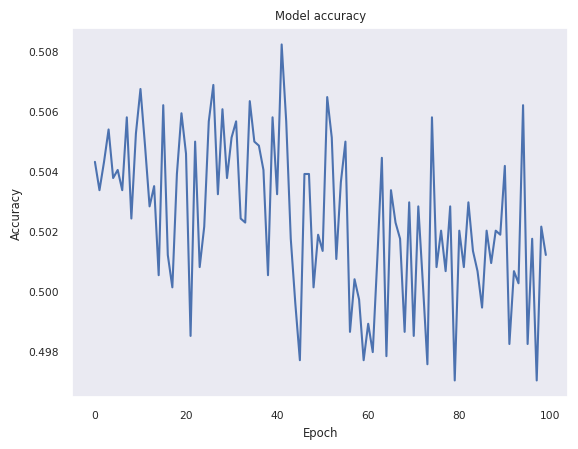

------------------
Training and Validation accuracy'
------------------


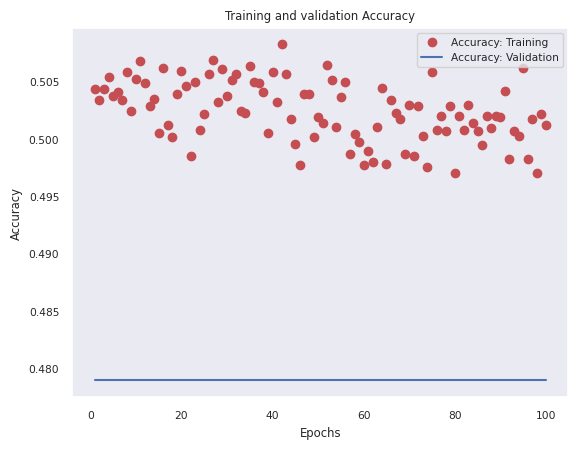

In [80]:
acc = history_drop2.history['accuracy']
val_acc = history_drop2.history['val_accuracy']
loss = history_drop2.history['loss']
val_loss = history_drop2.history['val_loss']
epochs = range(1, len(acc) + 1)

# Plot training accuracy values
print("------------------")
print("Model accuracy")
print("------------------")

plt.plot(history_drop2.history['accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.grid()
plt.show()

print("------------------")
print("Training and Validation accuracy'")
print("------------------")
plt.plot(epochs, acc, 'ro', label='Accuracy: Training')
plt.plot(epochs, val_acc, 'b', label='Accuracy: Validation')
plt.title('Training and validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.grid()
plt.legend()
plt.show()

------------------
Model loss
------------------


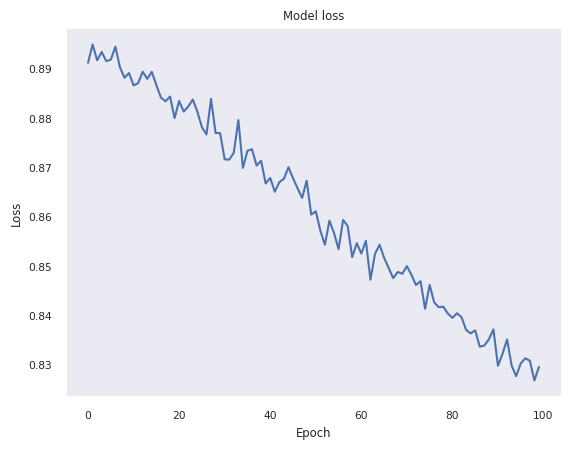

------------------
Training and Validation loss
------------------


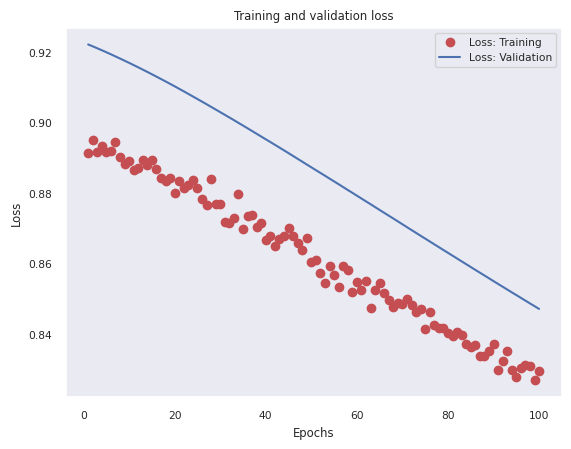

In [81]:
# Plot training loss values
print("------------------")
print("Model loss")
print("------------------")
plt.plot(history_drop2.history['loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.grid()
plt.show()

print("------------------")
print("Training and Validation loss")
print("------------------")
plt.plot(epochs, loss, 'ro', label='Loss: Training')
plt.plot(epochs, val_loss, 'b', label='Loss: Validation')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.grid()
plt.legend()
plt.show()

In [82]:
# plot results
print("------------------")
print("RESULTS")
AdaDelta_test_loss, AdaDelta_test_acc = network_drop2.evaluate(x_test, y_test)
print(f'test_loss: {AdaDelta_test_loss}')
print(f'test_acc: {AdaDelta_test_acc}')
print("------------------")
AdaDelta_results = network_drop2.evaluate(x_test, y_test)
AdaDelta_results
print("------------------")

------------------
RESULTS
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5063 - loss: 0.8363
test_loss: 0.8220170140266418
test_acc: 0.5124056339263916
------------------
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5063 - loss: 0.8363 
------------------


In [83]:
# Add in a dropout layer after each layer
network_drop3 = models.Sequential([layers.Input(shape=(4,)),
                                  layers.Dense(8, activation='relu'),
                                  layers.Dropout(0.05),
                                  layers.Dense(12, activation="relu"),
                                  layers.Dropout(0.05),
                                  layers.Dense(16, activation="relu"),
                                  layers.Dropout(0.05),
                                  layers.Dense(2, activation='softmax')])
# sample_weight_mode = 0.001
network_drop3.compile(optimizer="SGD",
                      loss="sparse_categorical_crossentropy",
                      metrics=["accuracy"])

init_weights = network_drop3.get_weights()
history_drop3 = network_drop3.fit(x_train,
                                  y_train,
                                  epochs=100,
                                  batch_size=256,
                                  validation_data=(x_val, y_val),
                                  verbose=0,
                                  )

------------------
Model accuracy
------------------


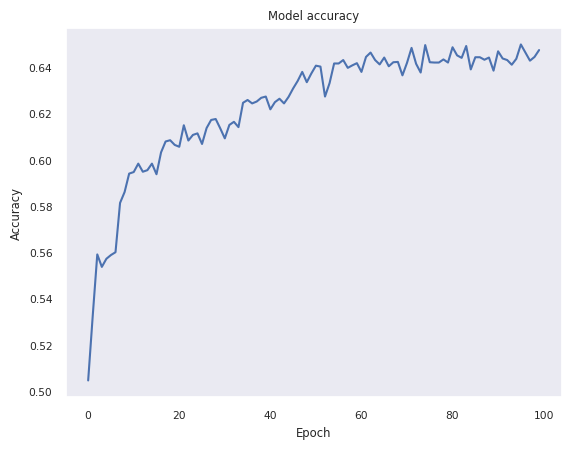

------------------
Training and Validation accuracy'
------------------


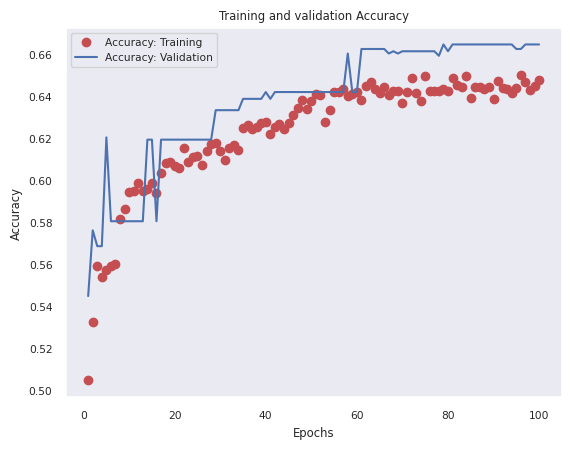

In [84]:
acc = history_drop3.history['accuracy']
val_acc = history_drop3.history['val_accuracy']
loss = history_drop3.history['loss']
val_loss = history_drop3.history['val_loss']
epochs = range(1, len(acc) + 1)

# Plot training accuracy values
print("------------------")
print("Model accuracy")
print("------------------")

plt.plot(history_drop3.history['accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.grid()
plt.show()

print("------------------")
print("Training and Validation accuracy'")
print("------------------")
plt.plot(epochs, acc, 'ro', label='Accuracy: Training')
plt.plot(epochs, val_acc, 'b', label='Accuracy: Validation')
plt.title('Training and validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.grid()
plt.legend()
plt.show()

------------------
Model loss
------------------


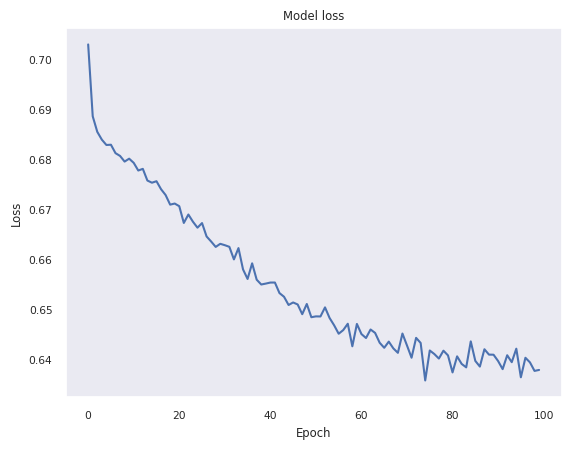

------------------
Training and Validation loss
------------------


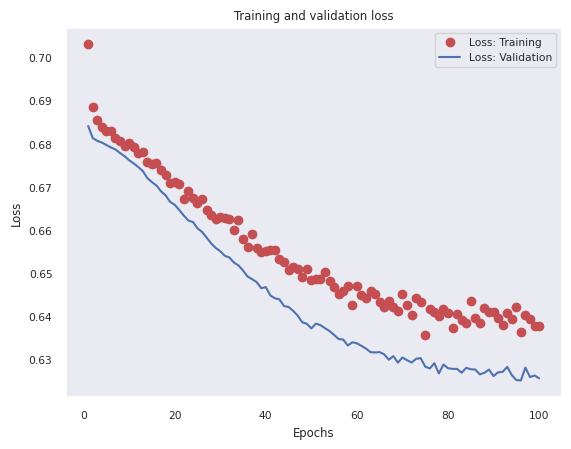

In [85]:
# Plot training loss values
print("------------------")
print("Model loss")
print("------------------")
plt.plot(history_drop3.history['loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.grid()
plt.show()

print("------------------")
print("Training and Validation loss")
print("------------------")
plt.plot(epochs, loss, 'ro', label='Loss: Training')
plt.plot(epochs, val_loss, 'b', label='Loss: Validation')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.grid()
plt.legend()
plt.show()

In [86]:
# plot results
print("------------------")
print("RESULTS")
SGD_test_loss, SGD_test_acc = network_drop3.evaluate(x_test, y_test)
print(f'test_loss: {SGD_test_loss}')
print(f'test_acc: {SGD_test_acc}')
print("------------------")
SGD_results = network_drop3.evaluate(x_test, y_test)
SGD_results
print("------------------")

------------------
RESULTS
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6390 - loss: 0.6253
test_loss: 0.6260248422622681
test_acc: 0.645091712474823
------------------
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6390 - loss: 0.6253 
------------------


In [87]:
# Add in a dropout layer after each layer
AdaGrad_network_drop = models.Sequential([layers.Input(shape=(4,)),
                                         layers.Dense(8, activation='relu'),
                                         layers.Dropout(0.05),
                                         layers.Dense(12, activation="relu"),
                                         layers.Dropout(0.05),
                                         layers.Dense(16, activation="relu"),
                                         layers.Dropout(0.05),
                                         layers.Dense(2, activation='softmax')]
                                         )
# sample_weight_mode = 0.001
AdaGrad_network_drop.compile(optimizer="AdaGrad",
                             loss="sparse_categorical_crossentropy",
                             metrics=["accuracy"])

AdaGrad_init_weights = AdaGrad_network_drop.get_weights()
AdaGrad_history_drop = AdaGrad_network_drop.fit(x_train,
                                                y_train,
                                                epochs=100,
                                                batch_size=256,
                                                validation_data=(x_val,
                                                                 y_val),
                                                verbose=0,
                                                )

------------------
Model accuracy AdaGrad
------------------


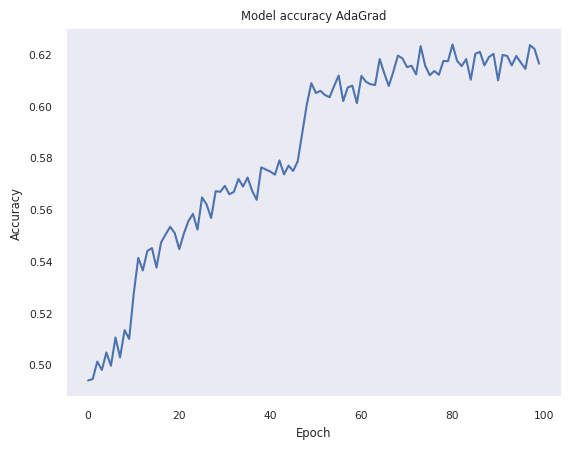

------------------
Training and Validation accuracy'
------------------


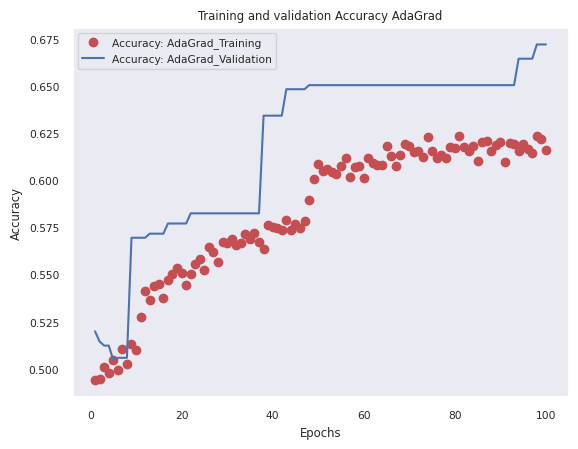

In [88]:
AdaGrad_acc = AdaGrad_history_drop.history['accuracy']
AdaGrad_val_acc = AdaGrad_history_drop.history['val_accuracy']
AdaGrad_loss = AdaGrad_history_drop.history['loss']
AdaGrad_val_loss = AdaGrad_history_drop.history['val_loss']
AdaGrad_epochs = range(1, len(AdaGrad_acc) + 1)

# Plot training accuracy values
print("------------------")
print("Model accuracy AdaGrad")
print("------------------")

plt.plot(AdaGrad_history_drop.history['accuracy'])
plt.title('Model accuracy AdaGrad')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.grid()
plt.show()

print("------------------")
print("Training and Validation accuracy'")
print("------------------")
plt.plot(AdaGrad_epochs, AdaGrad_acc, 'ro', label='Accuracy: AdaGrad_Training')
plt.plot(AdaGrad_epochs, AdaGrad_val_acc, 'b',
         label='Accuracy: AdaGrad_Validation')
plt.title('Training and validation Accuracy AdaGrad')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.grid()
plt.legend()
plt.show()

------------------
Model loss AdaGrad
------------------


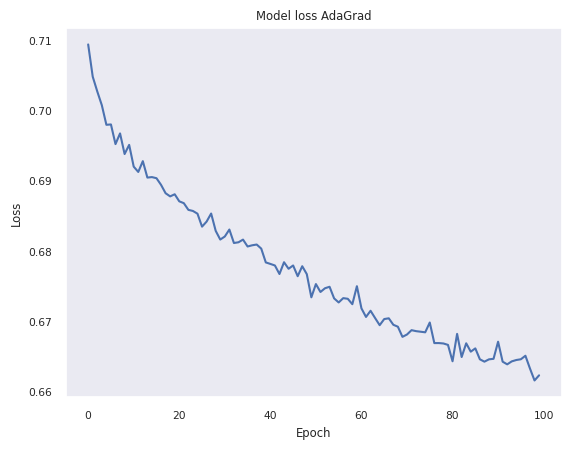

------------------
Training and Validation loss AdaGrad
------------------


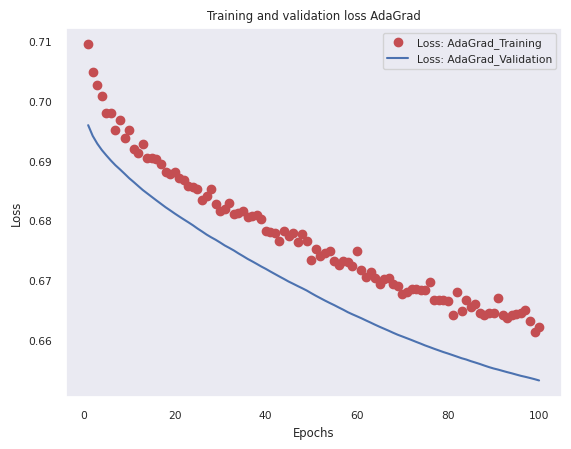

In [89]:
# Plot training loss values
print("------------------")
print("Model loss AdaGrad")
print("------------------")
plt.plot(AdaGrad_history_drop.history['loss'])
plt.title('Model loss AdaGrad')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.grid()
plt.show()

print("------------------")
print("Training and Validation loss AdaGrad")
print("------------------")
plt.plot(AdaGrad_epochs, AdaGrad_loss, 'ro', label='Loss: AdaGrad_Training')
plt.plot(AdaGrad_epochs, AdaGrad_val_loss, 'b',
         label='Loss: AdaGrad_Validation')
plt.title('Training and validation loss AdaGrad')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.grid()
plt.legend()
plt.show()

In [90]:
# plot results
print("------------------")
print("RESULTS")
AdaGrad_test_loss, AdaGrad_test_acc = AdaGrad_network_drop.evaluate(x_test,
                                                                    y_test)
print(f'test_loss: {AdaGrad_test_loss}')
print(f'test_acc: {AdaGrad_test_acc}')
print("------------------")
AdaGrad_results = AdaGrad_network_drop.evaluate(x_test, y_test)
AdaGrad_results
print("------------------")

------------------
RESULTS
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6722 - loss: 0.6555
test_loss: 0.6564462780952454
test_acc: 0.6655879020690918
------------------
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6722 - loss: 0.6555 
------------------


In [91]:
print("------------------")
print("RESULTS")
results
print("------------------")
print(f'test_loss: {test_loss}')
print(f'test_acc: {test_acc}')
print("------------------")
print("RESULTS - RMS Prop")
rmsprop_results
print("------------------")
print(f'test_loss: {rmsprop_test_loss}')
print(f'test_acc: {rmsprop_test_acc}')
print("------------------")
print("RESULTS - Adam")
adam_results
print("------------------")
print(f'test_loss: {adam_test_loss}')
print(f'test_acc: {adam_test_acc}')
print("------------------")
print("RESULTS - AdaDelta")
AdaDelta_results
print("------------------")
print(f'test_loss: {AdaDelta_test_loss}')
print(f'test_acc: {AdaDelta_test_acc}')
print("------------------")
print("RESULTS - SGD")
SGD_results
print("------------------")
print(f'test_loss: {SGD_test_loss}')
print(f'test_acc: {SGD_test_acc}')
print("------------------")
print("RESULTS - AdaGrad")
AdaGrad_results
print("------------------")
print(f'test_loss: {AdaGrad_test_loss}')
print(f'test_acc: {AdaGrad_test_acc}')

------------------
RESULTS
------------------
test_loss: 0.617975115776062
test_acc: 0.6655879020690918
------------------
RESULTS - RMS Prop
------------------
test_loss: 0.6176626682281494
test_acc: 0.6655879020690918
------------------
RESULTS - Adam
------------------
test_loss: 0.6185017228126526
test_acc: 0.6655879020690918
------------------
RESULTS - AdaDelta
------------------
test_loss: 0.8220170140266418
test_acc: 0.5124056339263916
------------------
RESULTS - SGD
------------------
test_loss: 0.6260248422622681
test_acc: 0.645091712474823
------------------
RESULTS - AdaGrad
------------------
test_loss: 0.6564462780952454
test_acc: 0.6655879020690918


In [92]:
results_data = {'optimiser': ["results", "RMS_prop", "adam", "adadelta",
                              "SGD", "adagrad"],
                'test loss': [test_loss, rmsprop_test_loss, adam_test_loss,
                              AdaDelta_test_loss, SGD_test_loss,
                              AdaGrad_test_loss],
                'test accuracy': [test_acc, rmsprop_test_acc, adam_test_acc,
                                  AdaDelta_test_acc, SGD_test_acc,
                                  AdaGrad_test_acc]}

results_data = pd.DataFrame(results_data)
results_data.sort_values(ascending=False, by='test accuracy')

,optimiser,test loss,test accuracy
0,results,0.617975,0.665588
1,RMS_prop,0.617663,0.665588
2,adam,0.618502,0.665588
5,adagrad,0.656446,0.665588
4,SGD,0.626025,0.645092
3,adadelta,0.822017,0.512406


In [93]:
# Add in a dropout layer after each layer
network_adam_5 = models.Sequential([layers.Input(shape=(4,)),
                                    layers.Dense(8, activation='relu'),
                                    layers.Dropout(0.05),
                                    layers.Dense(12, activation="relu"),
                                    layers.Dropout(0.05),
                                    layers.Dense(16, activation="relu"),
                                    layers.Dropout(0.05),
                                    layers.Dense(2, activation='softmax')]
                                   )
# sample_weight_mode = 0.001
network_adam_5.compile(optimizer="adam",
                       loss="sparse_categorical_crossentropy",
                       metrics=["accuracy"])

init_weights = network_adam_5.get_weights()
history_drop_adam = network_adam_5.fit(x_train,
                                       y_train,
                                       epochs=100,
                                       batch_size=256,
                                       validation_data=(x_val, y_val),
                                       verbose=0,
                                       )

------------------
Model accuracy
------------------


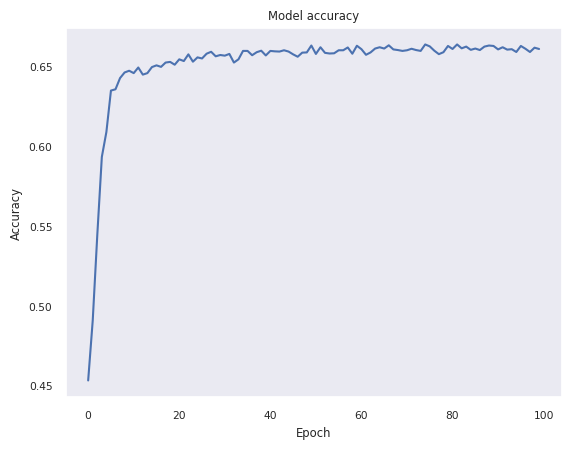

------------------
Training and Validation accuracy'
------------------


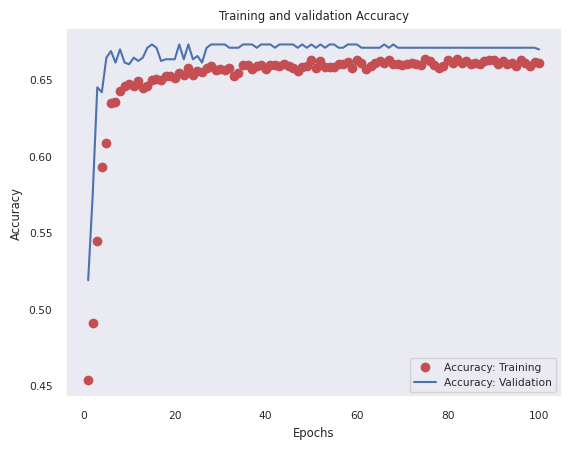

In [94]:
acc = history_drop_adam.history['accuracy']
val_acc = history_drop_adam.history['val_accuracy']
loss = history_drop_adam.history['loss']
val_loss = history_drop_adam.history['val_loss']
epochs = range(1, len(acc) + 1)

# Plot training accuracy values
print("------------------")
print("Model accuracy")
print("------------------")

plt.plot(history_drop_adam.history['accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.grid()
plt.show()

print("------------------")
print("Training and Validation accuracy'")
print("------------------")
plt.plot(epochs, acc, 'ro', label='Accuracy: Training')
plt.plot(epochs, val_acc, 'b', label='Accuracy: Validation')
plt.title('Training and validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.grid()
plt.legend()
plt.show()

------------------
Model loss
------------------


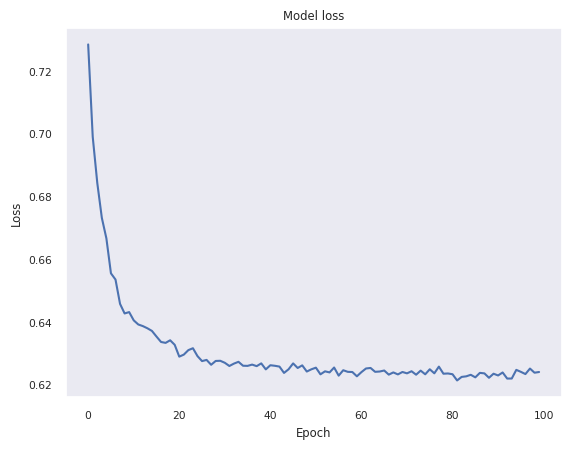

------------------
Training and Validation loss
------------------


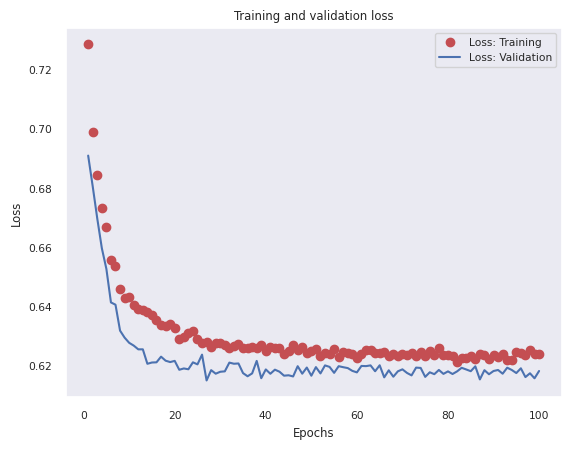

In [95]:
# Plot training loss values
print("------------------")
print("Model loss")
print("------------------")
plt.plot(history_drop_adam.history['loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.grid()
plt.show()

print("------------------")
print("Training and Validation loss")
print("------------------")
plt.plot(epochs, loss, 'ro', label='Loss: Training')
plt.plot(epochs, val_loss, 'b', label='Loss: Validation')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.grid()
plt.legend()
plt.show()

In [96]:
# plot results
print("------------------")
print("RESULTS")
adam_5_test_loss, adam_5_test_acc = network_adam_5.evaluate(x_test, y_test)
print(f'test_loss: {adam_5_test_loss}')
print(f'test_acc: {adam_5_test_acc}')
print("------------------")
adam_5_results = network_adam_5.evaluate(x_test, y_test)
adam_5_results
print("------------------")

------------------
RESULTS
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6702 - loss: 0.6189
test_loss: 0.6197643280029297
test_acc: 0.6666666865348816
------------------
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6702 - loss: 0.6189 
------------------


In [97]:
# Add in a dropout layer after each layer
network_adam_6 = models.Sequential([layers.Input(shape=(4,)),
                                    layers.Dense(8, activation='relu'),
                                    layers.Dropout(0.05),
                                    layers.Dense(12, activation="relu"),
                                    layers.Dropout(0.05),
                                    layers.Dense(16, activation="relu"),
                                    layers.Dropout(0.05),
                                    layers.Dense(2, activation='softmax')]
                                   )
# sample_weight_mode = 0.001
network_adam_6.compile(optimizer="adam",
                       loss="sparse_categorical_crossentropy",
                       metrics=["accuracy"])

init_weights = network_adam_6.get_weights()
history_drop_adam6 = network_adam_6.fit(x_train,
                                        y_train,
                                        epochs=100,
                                        batch_size=256,
                                        validation_data=(x_val, y_val),
                                        verbose=0,
                                        )

------------------
Model accuracy
------------------


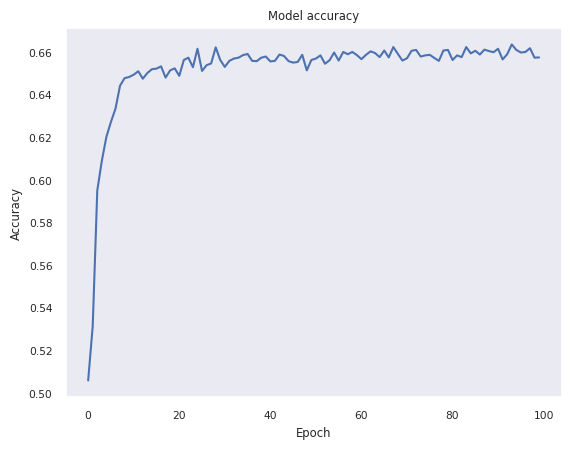

------------------
Training and Validation accuracy'
------------------


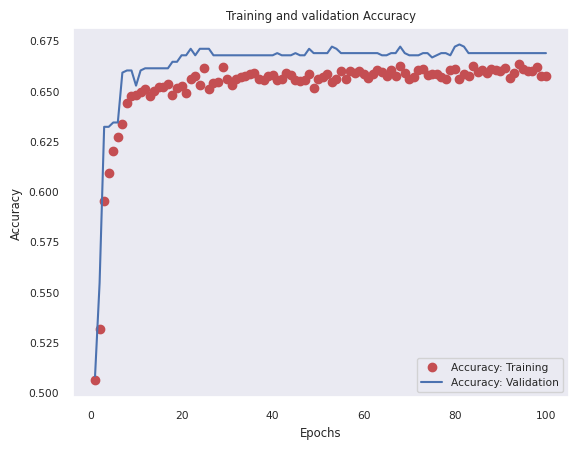

In [98]:
acc = history_drop_adam6.history['accuracy']
val_acc = history_drop_adam6.history['val_accuracy']
loss = history_drop_adam6.history['loss']
val_loss = history_drop_adam6.history['val_loss']
epochs = range(1, len(acc) + 1)

# Plot training accuracy values
print("------------------")
print("Model accuracy")
print("------------------")

plt.plot(history_drop_adam6.history['accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.grid()
plt.show()

print("------------------")
print("Training and Validation accuracy'")
print("------------------")
plt.plot(epochs, acc, 'ro', label='Accuracy: Training')
plt.plot(epochs, val_acc, 'b', label='Accuracy: Validation')
plt.title('Training and validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.grid()
plt.legend()
plt.show()

------------------
Model loss
------------------


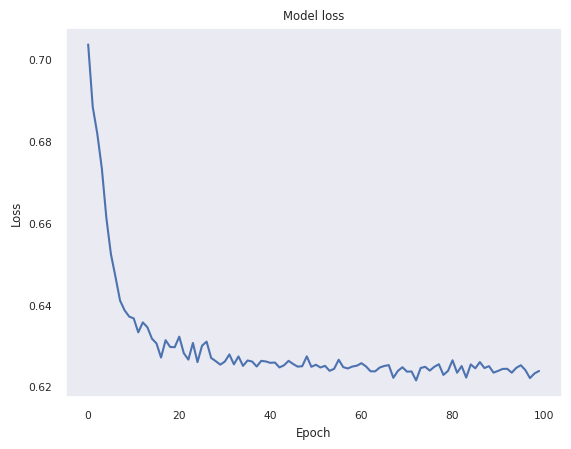

------------------
Training and Validation loss
------------------


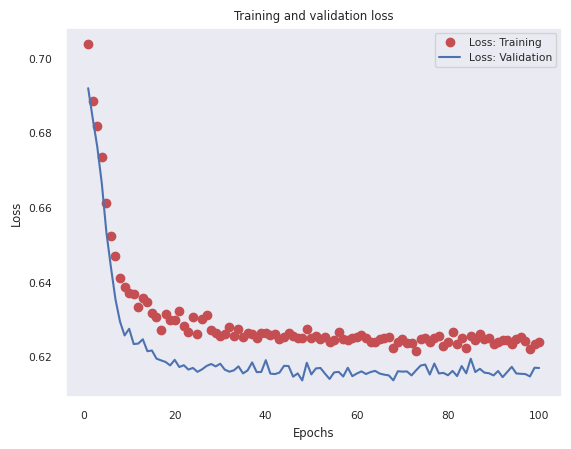

In [99]:
# Plot training loss values
print("------------------")
print("Model loss")
print("------------------")
plt.plot(history_drop_adam6.history['loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.grid()
plt.show()

print("------------------")
print("Training and Validation loss")
print("------------------")
plt.plot(epochs, loss, 'ro', label='Loss: Training')
plt.plot(epochs, val_loss, 'b', label='Loss: Validation')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.grid()
plt.legend()
plt.show()

In [100]:
# plot results
print("------------------")
print("RESULTS")
adam_6_test_loss, adam_6_test_acc = network_adam_6.evaluate(x_test, y_test)
print(f'test_loss: {adam_6_test_loss}')
print(f'test_acc: {adam_6_test_acc}')
print("------------------")
adam_6_results = network_adam_6.evaluate(x_test, y_test)
adam_6_results
print("------------------")

------------------
RESULTS
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.6680 - loss: 0.6193
test_loss: 0.6189433932304382
test_acc: 0.6655879020690918
------------------
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6680 - loss: 0.6193 
------------------


In [101]:
results_data_2 = {'optimiser': ["adam", "adam_5", "adam_6"],
                  'test loss': [adam_test_loss, adam_5_test_loss,
                                adam_6_test_loss],
                  'test accuracy': [adam_test_acc, adam_5_test_acc,
                                    adam_6_test_acc]}

results_data_2 = pd.DataFrame(results_data_2)
results_data_2.sort_values(ascending=False, by='test accuracy')

,optimiser,test loss,test accuracy
1,adam_5,0.619764,0.666667
0,adam,0.618502,0.665588
2,adam_6,0.618943,0.665588
